# <b><div style='padding:25px;background-color:#9B2335;color:white;border-radius:4px;font-size:100%;text-align: center'>Singapore  Resale Flat Prices Prediction<br></div>

# Importing required libraries

In [122]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import numpy as np
from scipy.stats import pearsonr,kstest, norm, boxcox
import scipy.stats as stats
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import math
sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)  
import pickle

# Reading the Dataset

In [2]:
df_90_99=pd.read_csv(r'dataset\ResaleFlatPricesBasedonApprovalDate19901999.csv')
df_00_12=pd.read_csv(r'dataset\ResaleFlatPricesBasedonApprovalDate2000Feb2012.csv')
df_12_14=pd.read_csv(r'dataset\ResaleFlatPricesBasedonRegistrationDateFromMar2012toDec2014.csv')
df_15_16=pd.read_csv(r'dataset\ResaleFlatPricesBasedonRegistrationDateFromJan2015toDec2016.csv')
df_17_=pd.read_csv(r'dataset\ResaleflatpricesbasedonregistrationdatefromJan2017onwards.csv')

In [3]:
df=pd.concat([df_90_99,df_00_12,df_12_14,df_15_16,df_17_], axis=0)

In [4]:
# df['month'] = pd.to_datetime(df['month'],format='%Y-%m' , errors='raise')
df.sample(10)

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease
153685,2004-07,HOUGANG,3 ROOM,24,HOUGANG AVE 3,04 TO 06,67.0,New Generation,1978,150000.0,NaN
264661,1999-07,CLEMENTI,5 ROOM,724,CLEMENTI WEST ST 2,16 TO 18,118.0,IMPROVED,1981,347000.0,NaN
96411,2002-08,PASIR RIS,4 ROOM,425,PASIR RIS DR 6,10 TO 12,102.0,Model A,1989,243000.0,NaN
221645,1998-11,HOUGANG,4 ROOM,320,HOUGANG AVE 5,10 TO 12,98.0,NEW GENERATION,1983,235000.0,NaN
201132,2006-02,WOODLANDS,4 ROOM,627,WOODLANDS AVE 6,10 TO 12,90.0,Model A2,1998,211000.0,NaN
135756,2022-08,SENGKANG,5 ROOM,301C,ANCHORVALE DR,07 TO 09,110.0,Improved,2001,555000.0,78 years 03 months
45084,2014-07,YISHUN,3 ROOM,706,YISHUN AVE 5,04 TO 06,68.0,New Generation,1984,295000.0,NaN
144299,2023-01,HOUGANG,4 ROOM,467,HOUGANG AVE 8,13 TO 15,107.0,Model A,1992,556000.0,68 years 10 months
89656,2021-01,TAMPINES,4 ROOM,871A,TAMPINES ST 84,04 TO 06,104.0,Model A,1989,450000.0,67 years 04 months
280523,1999-10,WOODLANDS,4 ROOM,408,WOODLANDS ST 41,07 TO 09,106.0,MODEL A,1996,278000.0,NaN


# Understanding the Dataset

In [5]:
print(df.shape)
df.sample(4)

(927465, 11)


,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease
53132,1993-10,YISHUN,5 ROOM,864,YISHUN AVE 4,07 TO 09,127.0,IMPROVED,1988,247000.0,NaN
15974,2015-11,SENGKANG,4 ROOM,277C,COMPASSVALE LINK,01 TO 03,90.0,Premium Apartment,2009,500000.0,92
174446,2005-03,TAMPINES,4 ROOM,496B,TAMPINES ST 43,07 TO 09,107.0,Model A,1993,270000.0,NaN
40859,2014-04,TAMPINES,5 ROOM,117,SIMEI ST 1,01 TO 03,122.0,Improved,1988,528000.0,NaN


In [6]:
print(df.dtypes,'\n\n')
df.info()


month                   object
town                    object
flat_type               object
block                   object
street_name             object
storey_range            object
floor_area_sqm         float64
flat_model              object
lease_commence_date      int64
resale_price           float64
remaining_lease         object
dtype: object 


<class 'pandas.core.frame.DataFrame'>
Index: 927465 entries, 0 to 181261
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                927465 non-null  object 
 1   town                 927465 non-null  object 
 2   flat_type            927465 non-null  object 
 3   block                927465 non-null  object 
 4   street_name          927465 non-null  object 
 5   storey_range         927465 non-null  object 
 6   floor_area_sqm       927465 non-null  float64
 7   flat_model           927465 non-null  object 
 8   lease_commence_date  

# Checking Null Values

In [7]:
df.isnull().sum()

month                       0
town                        0
flat_type                   0
block                       0
street_name                 0
storey_range                0
floor_area_sqm              0
flat_model                  0
lease_commence_date         0
resale_price                0
remaining_lease        709050
dtype: int64

In [8]:
df.isna().sum()

month                       0
town                        0
flat_type                   0
block                       0
street_name                 0
storey_range                0
floor_area_sqm              0
flat_model                  0
lease_commence_date         0
resale_price                0
remaining_lease        709050
dtype: int64

# Updating Data types

In [9]:
df['town'] = df['town'].astype('category')
df['flat_type'] = df['flat_type'].astype('category') 
df['block'] = df['block'].astype('category')
df['street_name'] = df['street_name'].astype('category') 
df['storey_range'] = df['storey_range'].astype('category')
df['flat_model'] = df['flat_model'].astype('category')
df['remaining_lease'] = df['remaining_lease'].astype('category')

In [10]:
for i in df.select_dtypes(include='number'):
    print(f'{i}- Min {df[i].min()}---, Max {df[i].max()} ')

floor_area_sqm- Min 28.0---, Max 307.0 
lease_commence_date- Min 1966---, Max 2020 
resale_price- Min 5000.0---, Max 1588000.0 


In [11]:
df['floor_area_sqm'] = df['floor_area_sqm'].astype('float32')
df['lease_commence_date'] = df['lease_commence_date'].astype('int32')
df['month'] = pd.to_datetime(df['month'], format='%Y-%m', errors='coerce')


In [12]:
for i in df.select_dtypes(exclude='number'):
    print(f'{i}- {df[i].value_counts().count()}\n ')

month- 414
 
town- 27
 
flat_type- 8
 
block- 2711
 
street_name- 584
 
storey_range- 25
 
flat_model- 34
 
remaining_lease- 726
 


In [13]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 927465 entries, 0 to 181261
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   month                927465 non-null  datetime64[ns]
 1   town                 927465 non-null  category      
 2   flat_type            927465 non-null  category      
 3   block                927465 non-null  category      
 4   street_name          927465 non-null  category      
 5   storey_range         927465 non-null  category      
 6   floor_area_sqm       927465 non-null  float32       
 7   flat_model           927465 non-null  category      
 8   lease_commence_date  927465 non-null  int32         
 9   resale_price         927465 non-null  float64       
 10  remaining_lease      218415 non-null  category      
dtypes: category(7), datetime64[ns](1), float32(1), float64(1), int32(1)
memory usage: 37.3 MB


In [14]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
month,927465,2006-08-20 18:43:29.075706368,1990-01-01 00:00:00,1999-01-01 00:00:00,2005-04-01 00:00:00,2014-03-01 00:00:00,2024-06-01 00:00:00,NaN
floor_area_sqm,927465.0,95.691246,28.0,73.0,93.0,113.0,307.0,25.824986
lease_commence_date,927465.0,1988.278012,1966.0,1981.0,1986.0,1996.0,2020.0,10.664813
resale_price,927465.0,320848.058806,5000.0,193000.0,297500.0,418000.0,1588000.0,170522.857301


### Checking Categorical feature classification

In [15]:
for i in df.select_dtypes(exclude='number'):
    print('-----'*10,'\n',df[i].value_counts().reset_index().sort_values(by=i,ascending=True),'\n','-----'*10)

-------------------------------------------------- 
          month  count
331 1990-01-01   1507
401 1990-02-01    931
379 1990-03-01   1150
395 1990-04-01   1047
410 1990-05-01    778
..         ...    ...
228 2024-02-01   2125
237 2024-03-01   2049
161 2024-04-01   2377
123 2024-05-01   2511
411 2024-06-01    427

[414 rows x 2 columns] 
 --------------------------------------------------
-------------------------------------------------- 
                town  count
5        ANG MO KIO  52090
3             BEDOK  66677
20           BISHAN  21271
7       BUKIT BATOK  44429
9       BUKIT MERAH  34383
16    BUKIT PANJANG  27708
25      BUKIT TIMAH   2519
24     CENTRAL AREA   7150
8     CHOA CHU KANG  38348
15         CLEMENTI  28040
14          GEYLANG  28179
6           HOUGANG  50772
18      JURONG EAST  24796
2       JURONG WEST  66715
17  KALLANG/WHAMPOA  27199
26     LIM CHU KANG     64
23    MARINE PARADE   8041
10        PASIR RIS  33237
21          PUNGGOL  20665
13       QUEE

Flat Type and Flat Model has text inconsostency. 

### Cleaning Text inconsistency

In [16]:
df['town'] = df['town'].str.strip().str.title().astype('category')
df['town'] = df['town'].astype('category')
df['town'].value_counts().reset_index().sort_values(by='town')

,town,count
5,Ang Mo Kio,52090
3,Bedok,66677
20,Bishan,21271
7,Bukit Batok,44429
9,Bukit Merah,34383
16,Bukit Panjang,27708
25,Bukit Timah,2519
24,Central Area,7150
8,Choa Chu Kang,38348
15,Clementi,28040


In [17]:
df['flat_type'].cat.categories.unique()

Index(['1 ROOM', '2 ROOM', '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE',
       'MULTI GENERATION', 'MULTI-GENERATION'],
      dtype='object')

In [18]:
df['flat_type'] = df['flat_type'].cat.rename_categories({'MULTI-GENERATION':'Multi Generation'})
df['flat_type'] = df['flat_type'].str.strip().str.title().astype('category')
df['flat_type'] = df['flat_type'].astype('category')
df['flat_type'].value_counts().reset_index().sort_values(by='flat_type')

,flat_type,count
5,1 Room,1304
4,2 Room,11841
1,3 Room,296064
0,4 Room,352489
2,5 Room,195520
3,Executive,69704
6,Multi Generation,543


In [19]:
df['street_name'] = df['street_name'].str.strip().str.title().astype('category')
df['street_name'] = df['street_name'].astype('category')
df['street_name'].value_counts().reset_index().sort_values(by='street_name')

,street_name,count
141,Admiralty Dr,2370
225,Admiralty Link,1498
521,Ah Hood Rd,185
565,Alexandra Rd,59
583,Aljunied Ave 2,1
...,...,...
384,Yung Kuang Rd,530
468,Yung Loh Rd,299
387,Yung Ping Rd,515
429,Yung Sheng Rd,408


In [20]:
df['flat_model'] = df['flat_model'].str.strip().str.title().astype('category')
df['flat_model'].value_counts().reset_index().sort_values(by='flat_model')

,flat_model,count
16,2-Room,138
20,3Gen,32
11,Adjoined Flat,1250
6,Apartment,35504
9,Dbss,3308
1,Improved,241907
17,Improved-Maisonette,126
7,Maisonette,29681
0,Model A,265265
10,Model A-Maisonette,2078


In [21]:
df['Avg_storey_range']= df['storey_range'].apply(lambda x: (int(x.split(' TO ')[0]) + int(x.split(' TO ')[1])) / 2) 
df['Avg_storey_range'] = df['Avg_storey_range'].astype('int8')

In [22]:
df.sample(4)

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease,Avg_storey_range
99838,2002-09-01,Woodlands,3 Room,204,Marsiling Dr,01 TO 03,68.0,New Generation,1981,104000.0,NaN,2
29053,2018-06-01,Jurong West,3 Room,186,Boon Lay Ave,01 TO 03,59.0,Improved,1975,175000.0,56 years 04 months,2
342934,2010-12-01,Hougang,4 Room,408,Hougang Ave 10,10 TO 12,98.0,New Generation,1986,415000.0,NaN,11
234291,1999-02-01,Ang Mo Kio,3 Room,445,Ang Mo Kio Ave 10,07 TO 09,67.0,New Generation,1979,156000.0,NaN,8


In [23]:
df.Avg_storey_range.value_counts()

Avg_storey_range
5     232709
8     212720
2     186466
11    178899
14     62059
17     24174
20     11441
23      7535
26      3445
3       2700
29      1647
13      1259
32       631
35       577
38       516
18       265
41       246
44        65
47        53
28        39
50        17
33         2
Name: count, dtype: int64

## Features Details and Types

1. Month - Month of sale of the property
2. Town - Property Location
3. Flat Type - Property Classification
5. Block - Building contains multiple units/flats
6. Street Name - Property Location
7. Storey Range - Estimated range of floors the unit sold was located on
8. Floor Area SQM - Total Estimated space measured in square meters
9. Flat Model - Classification of units by generation of which the flat was made, ranging from New Generation, DBSS, Improved, Apartment
10. Lease Commence Date - Starting point of a lease agreement, marking the beginning of the lease term during which the tenant has the right to use and occupy the leased property
11. Resale Price - Cost of the flat sold
12. Remaining Lease

In [24]:
print(df.info())
df.sample(3)

<class 'pandas.core.frame.DataFrame'>
Index: 927465 entries, 0 to 181261
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   month                927465 non-null  datetime64[ns]
 1   town                 927465 non-null  category      
 2   flat_type            927465 non-null  category      
 3   block                927465 non-null  category      
 4   street_name          927465 non-null  category      
 5   storey_range         927465 non-null  category      
 6   floor_area_sqm       927465 non-null  float32       
 7   flat_model           927465 non-null  category      
 8   lease_commence_date  927465 non-null  int32         
 9   resale_price         927465 non-null  float64       
 10  remaining_lease      218415 non-null  category      
 11  Avg_storey_range     927465 non-null  int8          
dtypes: category(7), datetime64[ns](1), float32(1), float64(1), int32(1), int8(1)


,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease,Avg_storey_range
66270,2020-02-01,Bedok,3 Room,103,Bedok Reservoir Rd,07 TO 09,67.0,New Generation,1985,285000.0,64 years 04 months,8
61140,2019-11-01,Hougang,5 Room,571,Hougang St 51,07 TO 09,118.0,Improved,1997,488000.0,76 years 04 months,8
271324,1999-08-01,Pasir Ris,5 Room,416,Pasir Ris Dr 6,07 TO 09,122.0,Improved,1989,375000.0,NaN,8


In [25]:
print(df.isnull().sum(),'\n\n',df.isna().sum())

month                       0
town                        0
flat_type                   0
block                       0
street_name                 0
storey_range                0
floor_area_sqm              0
flat_model                  0
lease_commence_date         0
resale_price                0
remaining_lease        709050
Avg_storey_range            0
dtype: int64 

 month                       0
town                        0
flat_type                   0
block                       0
street_name                 0
storey_range                0
floor_area_sqm              0
flat_model                  0
lease_commence_date         0
resale_price                0
remaining_lease        709050
Avg_storey_range            0
dtype: int64


In [26]:
df.columns

Index(['month', 'town', 'flat_type', 'block', 'street_name', 'storey_range',
       'floor_area_sqm', 'flat_model', 'lease_commence_date', 'resale_price',
       'remaining_lease', 'Avg_storey_range'],
      dtype='object')

In [27]:
num=df.select_dtypes(include=['number']).columns
for col in num:
    print(f"{col} -  {(df[col] <= 0).sum()}")

floor_area_sqm -  0
lease_commence_date -  0
resale_price -  0
Avg_storey_range -  0


In [28]:
df.columns

Index(['month', 'town', 'flat_type', 'block', 'street_name', 'storey_range',
       'floor_area_sqm', 'flat_model', 'lease_commence_date', 'resale_price',
       'remaining_lease', 'Avg_storey_range'],
      dtype='object')

# Feature Engineering

## Deriving new features

In [29]:
if 'floor_area_sqm' in df.columns:
  # Avoid division by zero (if floor area is zero)
  df['price_per_sqm'] = np.where(df['floor_area_sqm'] > 0, df['resale_price'] / df['floor_area_sqm'], np.nan)
else:
  df['price_per_sqm'] = np.nan  # Handle missing floor area

In [30]:
df['year'] = df['month'].dt.year
df['month_number'] = df['month'].dt.month
df['full_address'] = df['block'].astype(str) + " " + df['street_name'].astype(str) + " " + df['town'].astype(str)

In [31]:
df['remaining_lease_year'] = df['lease_commence_date'] + 99 - df['month'].dt.year

In [32]:
df.columns

Index(['month', 'town', 'flat_type', 'block', 'street_name', 'storey_range',
       'floor_area_sqm', 'flat_model', 'lease_commence_date', 'resale_price',
       'remaining_lease', 'Avg_storey_range', 'price_per_sqm', 'year',
       'month_number', 'full_address', 'remaining_lease_year'],
      dtype='object')

In [33]:
df.sample(5)

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease,Avg_storey_range,price_per_sqm,year,month_number,full_address,remaining_lease_year
257896,1999-06-01,Bukit Batok,3 Room,180,Bt Batok West Ave 8,10 TO 12,67.0,New Generation,1984,118000.0,NaN,11,1761.194030,1999,6,180 Bt Batok West Ave 8 Bukit Batok,84
35158,2013-12-01,Bedok,3 Room,525,Bedok Nth St 3,01 TO 03,67.0,New Generation,1979,325000.0,NaN,2,4850.746269,2013,12,525 Bedok Nth St 3 Bedok,65
261890,2008-05-01,Sengkang,5 Room,145,Rivervale Dr,01 TO 03,116.0,Improved,1999,335000.0,NaN,2,2887.931034,2008,5,145 Rivervale Dr Sengkang,90
236564,2007-06-01,Jurong West,Executive,752,Jurong West St 74,07 TO 09,148.0,Apartment,1995,345000.0,NaN,8,2331.081081,2007,6,752 Jurong West St 74 Jurong West,87
6397,2015-05-01,Sembawang,4 Room,469B,Admiralty Dr,13 TO 15,102.0,Premium Apartment,2001,380000.0,85,14,3725.490196,2015,5,469B Admiralty Dr Sembawang,85


In [34]:
df1=df[['town', 'flat_type','floor_area_sqm', 'flat_model', 'lease_commence_date', 'resale_price',
        'price_per_sqm', 'year','month_number', 'full_address', 'remaining_lease_year','Avg_storey_range']].copy()

In [35]:
continuous = ['floor_area_sqm', 'resale_price','price_per_sqm']
# discrete = ['lease_commence_date', 'year', 'month_number']
# nominal = ['month', 'town', 'flat_type', 'block', 'street_name', 'flat_model', 'full_address']
# ordinal = ['storey_range', 'remaining_lease']
categorical = ['year','month_number' ,'town', 'flat_type',
       'flat_model','Avg_storey_range','lease_commence_date','remaining_lease_year','floor_area_sqm']

## Exploratory Data Analysis. Before Handling Skewness and Outliers

In [36]:
def univar_num(df, col):
    plt.figure(figsize=(16, 8))
    df = df.dropna(subset=[col])


    mean=df[col].mean()
    median=df[col].median()
    mode=df[col].mode()[0]

    plt.subplot(2, 3, 1)
    sns.histplot(data=df, x=col, kde=True, bins=50,color='maroon',fill=True)
    plt.title(f'Histogram for {col}')
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    
    plt.legend()
    plt.tight_layout()
    
    plt.subplot(2, 3, 2)
    sns.boxplot(data=df, x=col, color='lightgrey',legend=True)
    plt.xticks(rotation=45)
    plt.title(f'Box Plot for {col}')
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    plt.legend()
    plt.tight_layout()

    
    plt.subplot(2, 3, 3)
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.gca().get_lines()[1].set_color('maroon')
    plt.gca().get_lines()[0].set_color('darkgreen')
    plt.title(f'QQ Plot for {col}')

    plt.tight_layout()
    
    plt.tight_layout()
    plt.show()

### Numerical features Distribution

In [37]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
floor_area_sqm,927465.0,95.691246,25.824986,28.000000,73.00000,93.000000,113.0,3.070000e+02
lease_commence_date,927465.0,1988.278012,10.664813,1966.000000,1981.00000,1986.000000,1996.0,2.020000e+03
resale_price,927465.0,320848.058806,170522.857301,5000.000000,193000.00000,297500.000000,418000.0,1.588000e+06
price_per_sqm,927465.0,3318.137732,1532.133749,161.290323,2292.26087,2956.521739,4200.0,1.559140e+04
year,927465.0,2006.174394,9.324771,1990.000000,1999.00000,2005.000000,2014.0,2.024000e+03
month_number,927465.0,6.550482,3.413028,1.000000,4.00000,7.000000,10.0,1.200000e+01
remaining_lease_year,927465.0,81.103618,10.717863,41.000000,74.00000,83.000000,90.0,1.010000e+02
Avg_storey_range,927465.0,7.689827,4.821337,2.000000,5.00000,8.000000,11.0,5.000000e+01


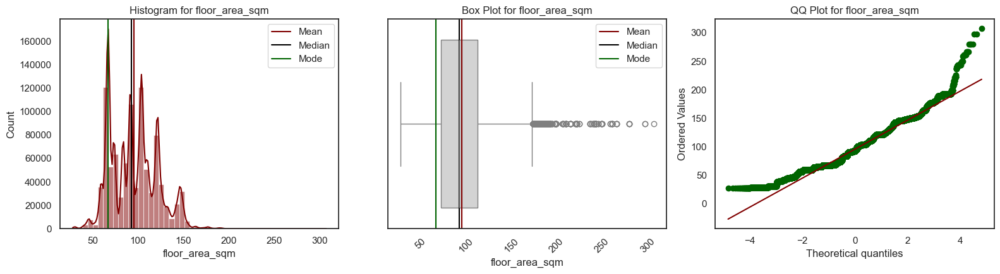


Skew for floor_area_sqm is 0.37



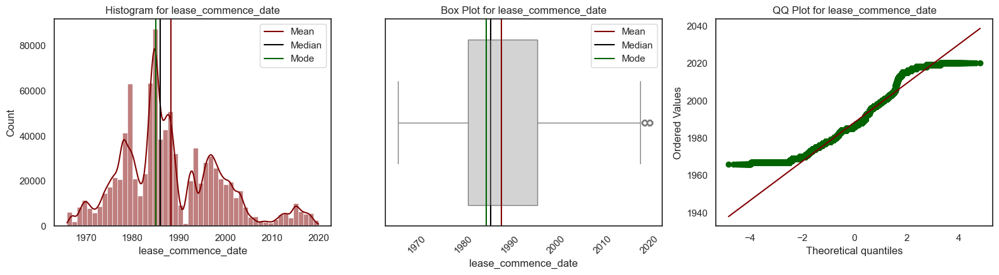


Skew for lease_commence_date is 0.65



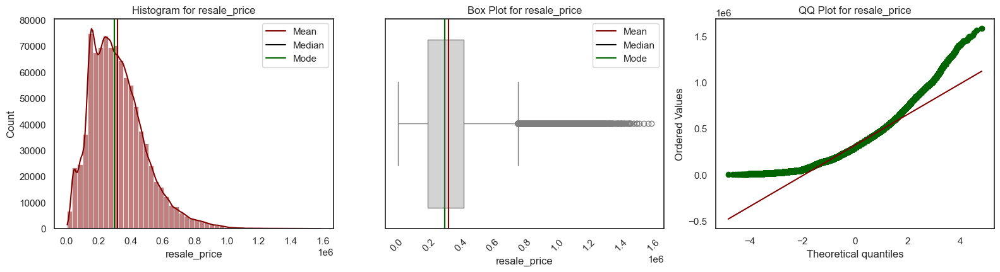


Skew for resale_price is 0.94



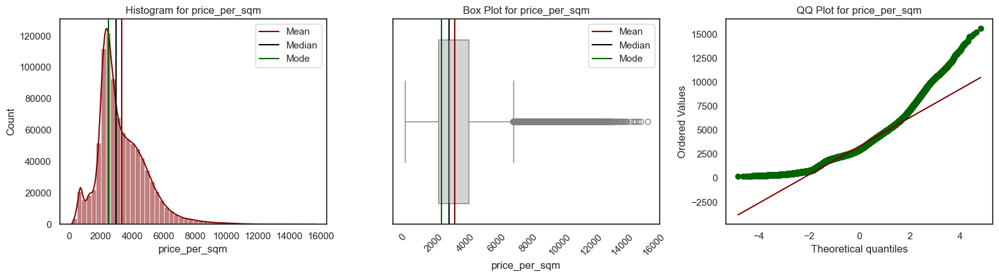


Skew for price_per_sqm is 1.07



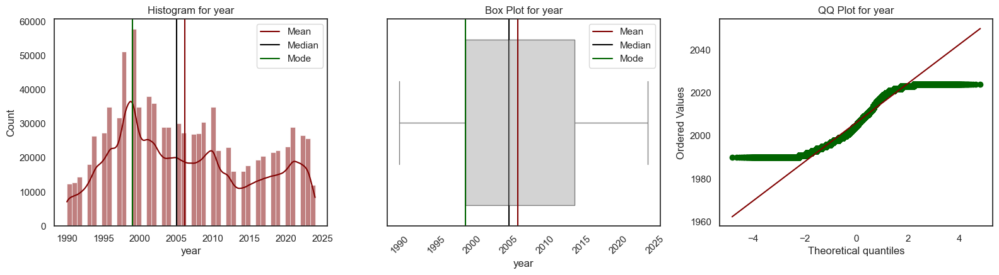


Skew for year is 0.29



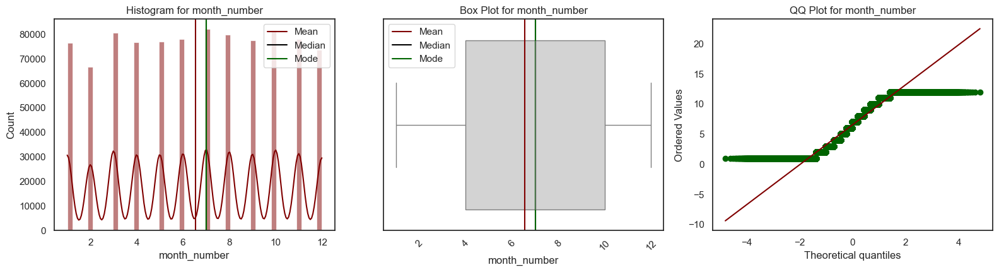


Skew for month_number is -0.03



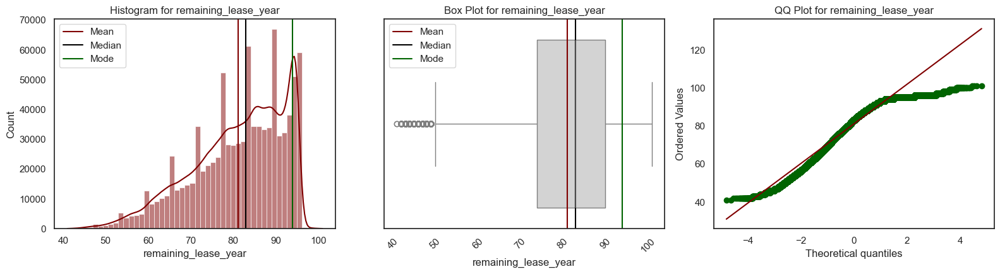


Skew for remaining_lease_year is -0.70



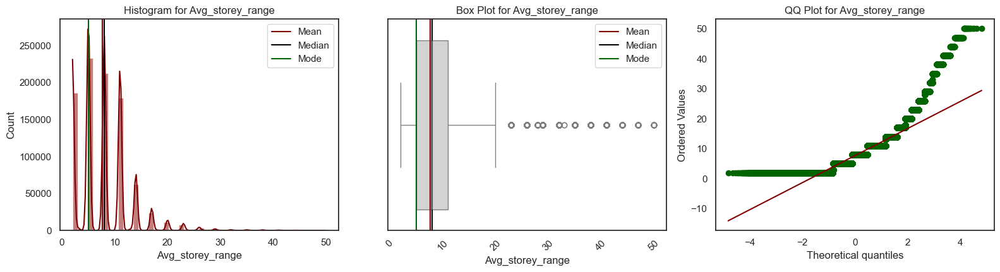


Skew for Avg_storey_range is 1.35



In [38]:
color_good = '\033[32m'  # Dark Green for good skew
color_okay = '\033[92m'  # Light Green for okay skew
color_bad = '\033[91m'  # Maroon for bad skew
color_neutral = '\033[0m'  # Reset color

skewed_col = []

sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)  

for i in df1.select_dtypes(include='number'):
    univar_num(df1,i) 
    skew_val = df1[i].skew()
    
    if -0.5 <= skew_val <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skew_val <= 0.5 or -0.5 < skew_val < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
        skewed_col.append(i)

    print(f"\n{color}Skew for {i} is {skew_val:.2f}{color_neutral}\n")

### Categorical features Distribution

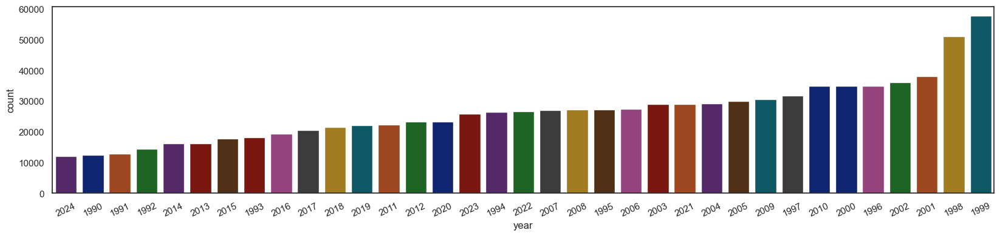

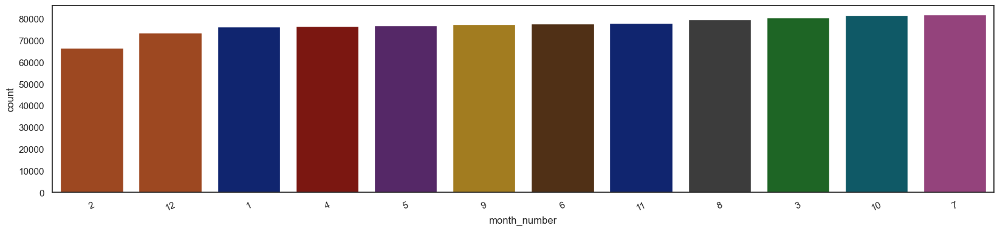

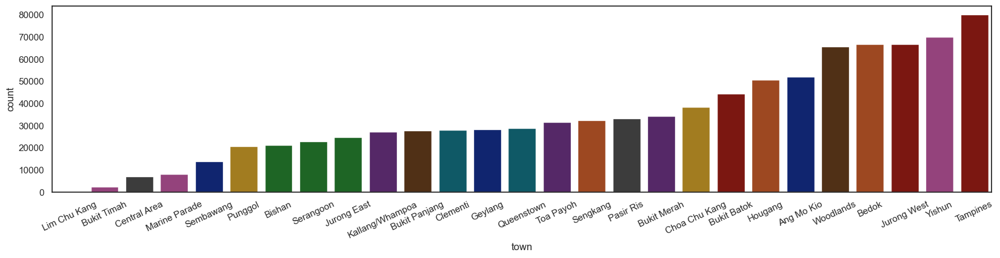

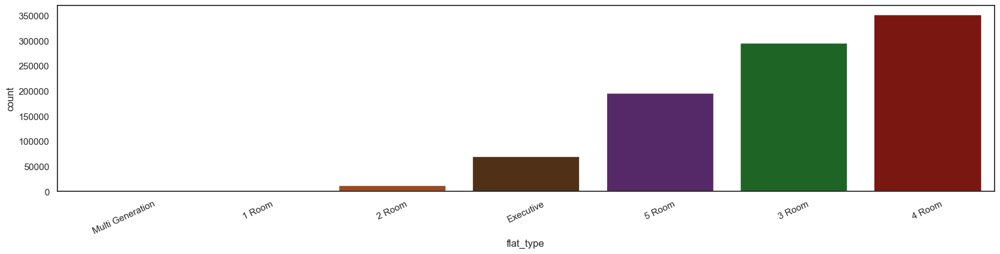

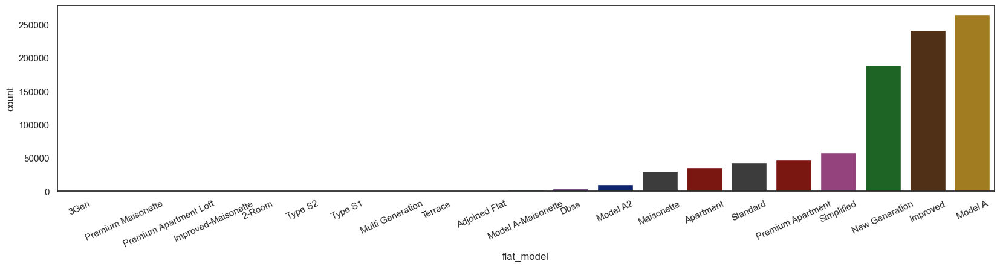

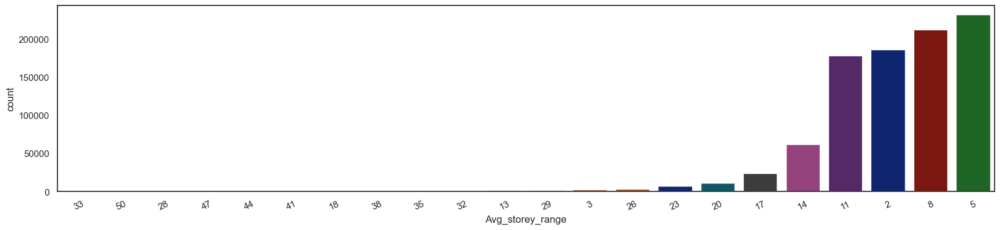

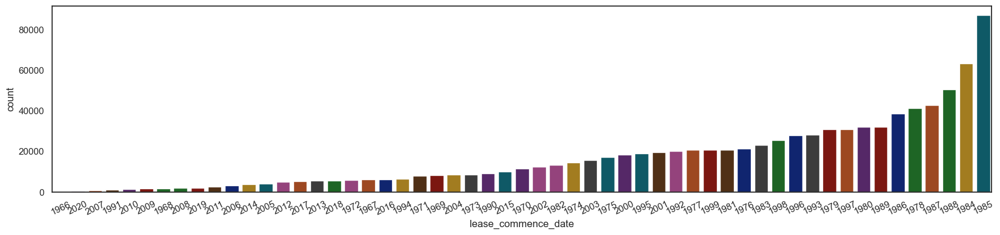

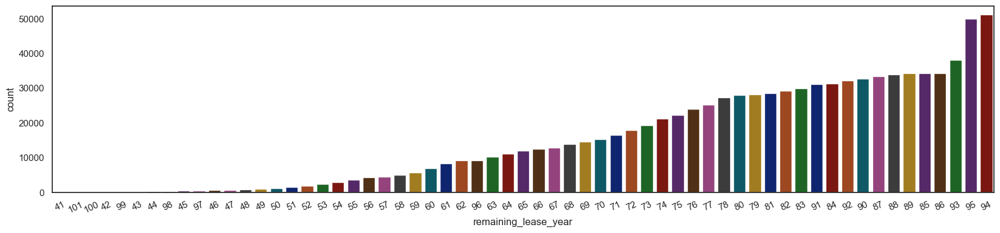

In [42]:
categorical.remove('floor_area_sqm')
for i in categorical:
    plt.figure(figsize=(20, 4))
    sns.countplot(data=df1, x=df1[i], hue=i, order = df1[i].value_counts().index.tolist()[::-1],palette='dark',legend=False)
    plt.xticks(rotation=25)
    plt.show()
categorical.append('floor_area_sqm')

### Outliers based on the Categorical 

In [85]:
sns.color_palette('dark')


[(0.0, 0.10980392156862745, 0.4980392156862745),
 (0.6941176470588235, 0.25098039215686274, 0.050980392156862744),
 (0.07058823529411765, 0.44313725490196076, 0.10980392156862745),
 (0.5490196078431373, 0.03137254901960784, 0.0),
 (0.34901960784313724, 0.11764705882352941, 0.44313725490196076),
 (0.34901960784313724, 0.1843137254901961, 0.050980392156862744),
 (0.6352941176470588, 0.20784313725490197, 0.5098039215686274),
 (0.23529411764705882, 0.23529411764705882, 0.23529411764705882),
 (0.7215686274509804, 0.5215686274509804, 0.0392156862745098),
 (0.0, 0.38823529411764707, 0.4549019607843137)]

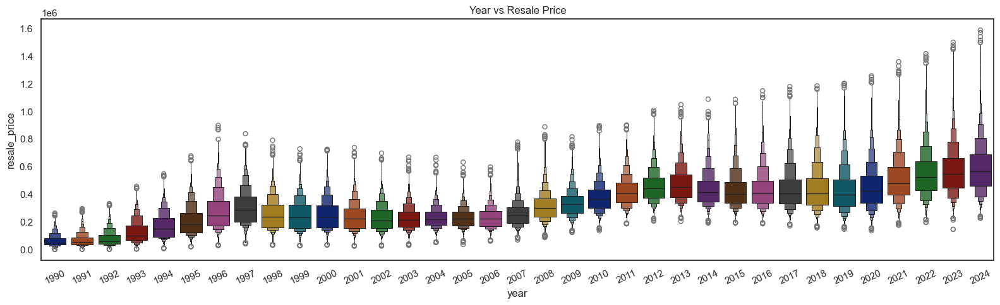

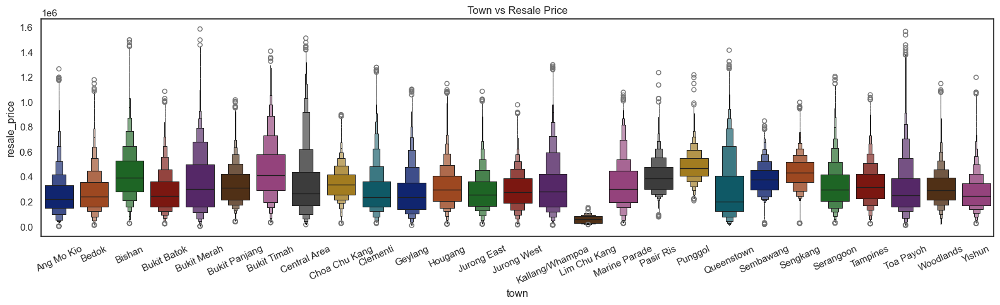

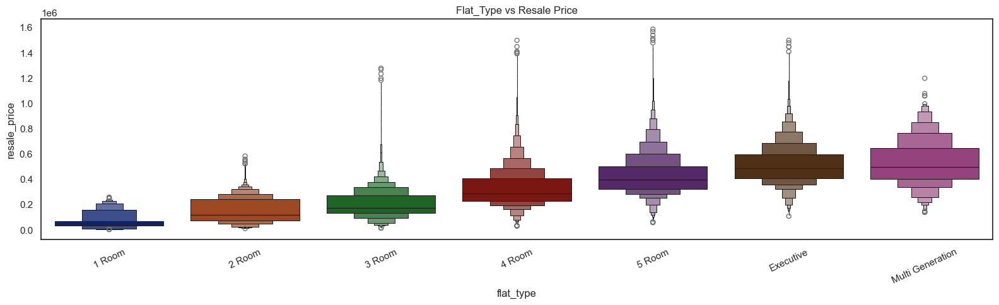

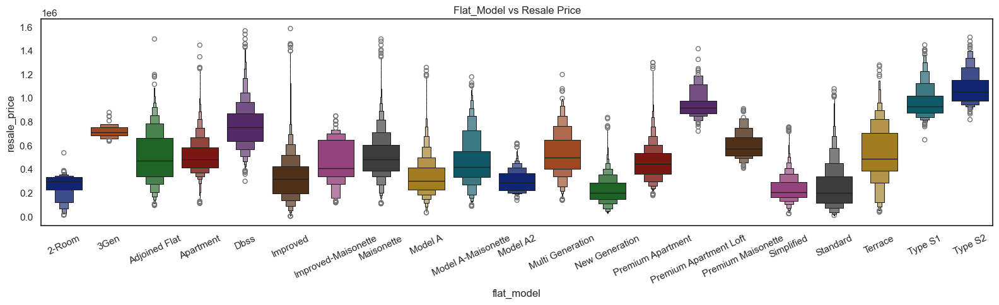

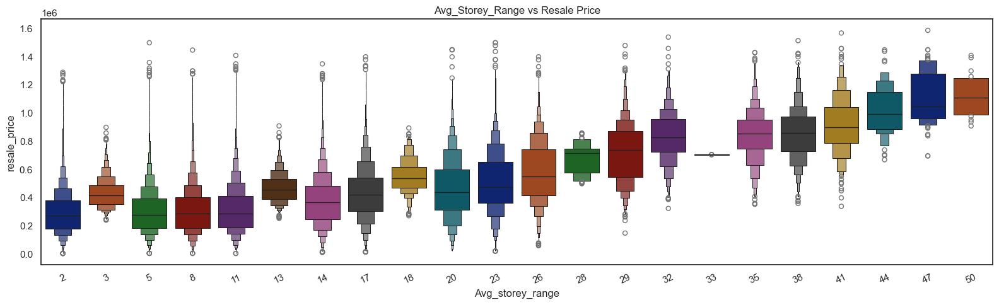

In [86]:
for i in ['year','town','flat_type','flat_model','Avg_storey_range']:
    plt.figure(figsize=(16,5))
    sns.boxenplot(data=df1,x=i,y="resale_price",hue=i,palette='dark',legend=False)
    plt.xticks(rotation=25)
    plt.title(f'{i.title()} vs Resale Price')
    plt.tight_layout()
    plt.show()

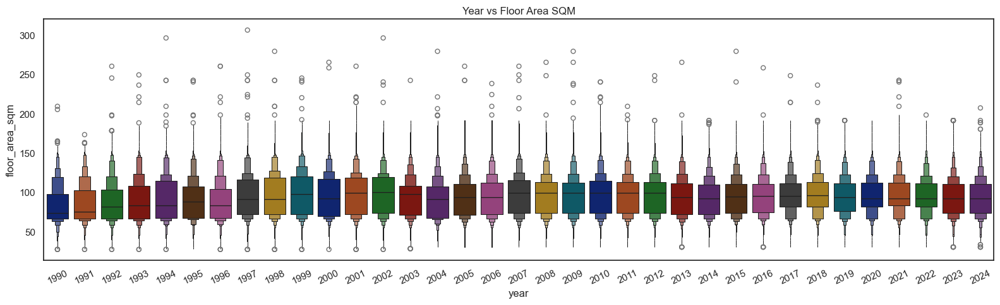

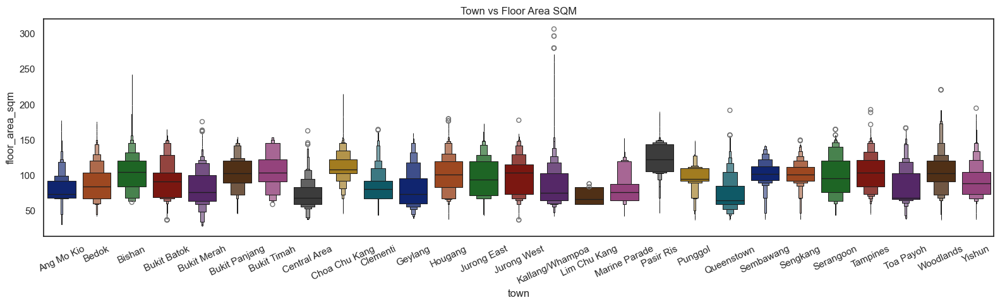

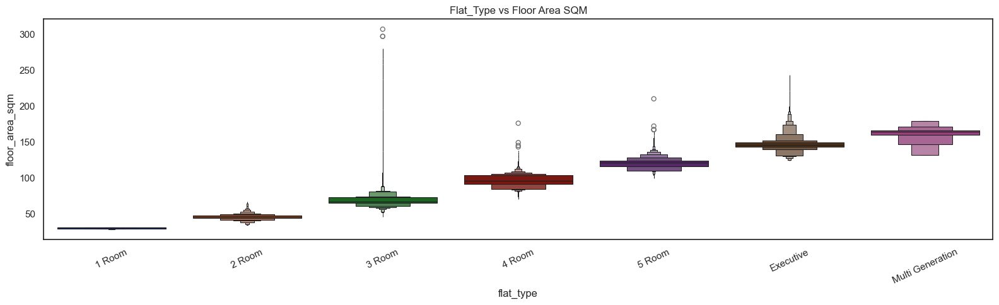

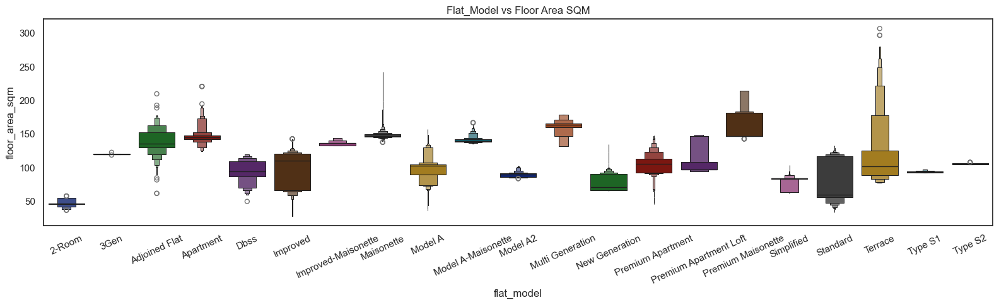

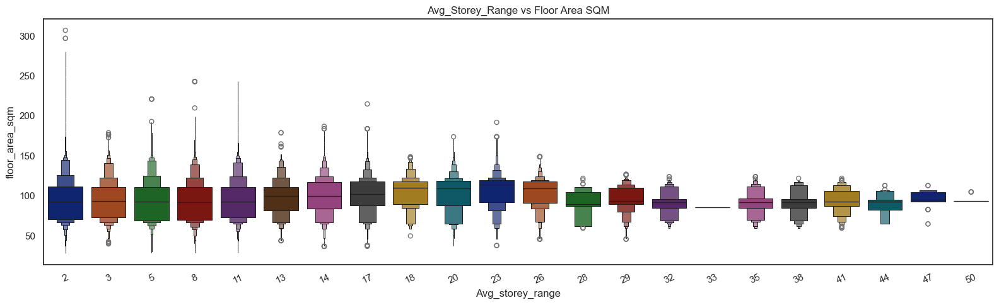

In [87]:
for i in ['year','town','flat_type','flat_model','Avg_storey_range',]:
    plt.figure(figsize=(16,5))
    sns.boxenplot(data=df1,x=i,y="floor_area_sqm",hue=i,palette='dark',legend=False)
    plt.xticks(rotation=25)
    plt.title(f'{i.title()} vs Floor Area SQM')
    plt.tight_layout()
    plt.show()


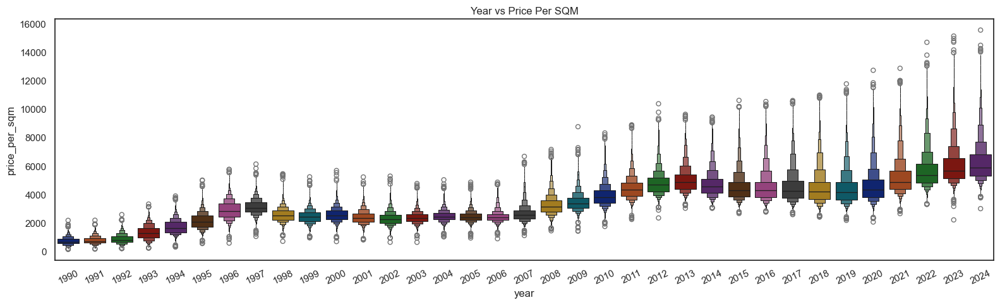

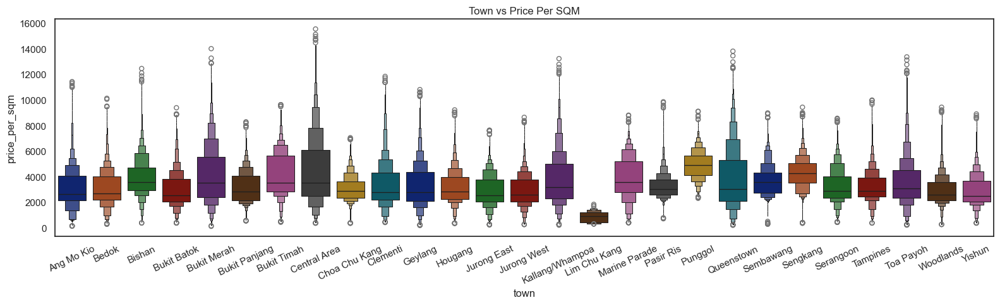

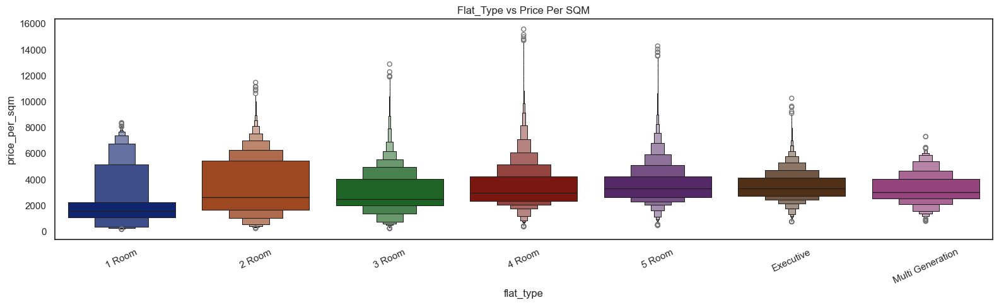

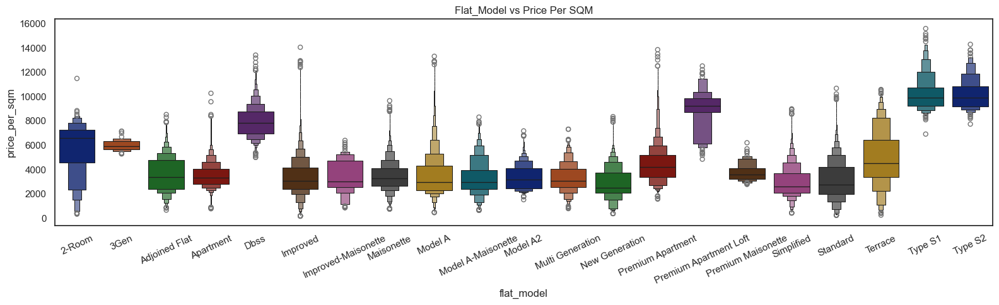

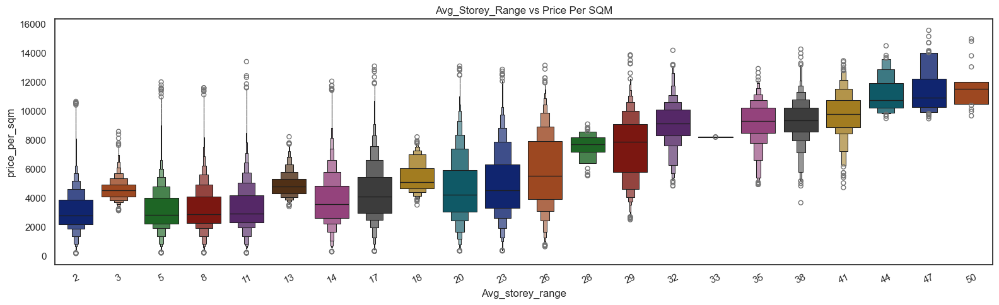

In [88]:
for i in ['year','town','flat_type','flat_model','Avg_storey_range',]:
    plt.figure(figsize=(16,5))
    sns.boxenplot(data=df1,x=i,y="price_per_sqm",hue=i,palette='dark',legend=False)
    plt.xticks(rotation=25)
    plt.title(f'{i.title()} vs Price Per SQM')
    plt.tight_layout()
    plt.show()


### Word Cloud - Checking the frequency in the categorical data

#### Frequency of Flat Type and Flat Model

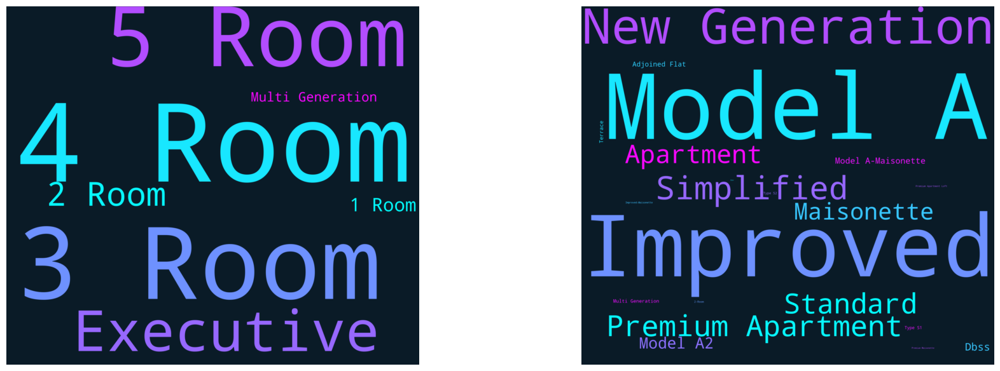

In [171]:
Flat_type = Counter(df1['flat_type'])
Flat_model = Counter(df1['flat_model'])

wordCloud_Flat_type = WordCloud(width= 2300, height = 2000, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_Flat_type.generate_from_frequencies(Flat_type)

# Add this line to create wordCloud_Flat_model
wordCloud_Flat_model = WordCloud(width= 2300, height = 2000, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_Flat_model.generate_from_frequencies(Flat_model)

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(wordCloud_Flat_type, interpolation='bilinear',cmap='Blues')
plt.subplot(1,2,2)
plt.imshow(wordCloud_Flat_model, interpolation='bilinear')
plt.axis('off')
plt.tight_layout()
plt.show()

#### Frequency of Town and Storey

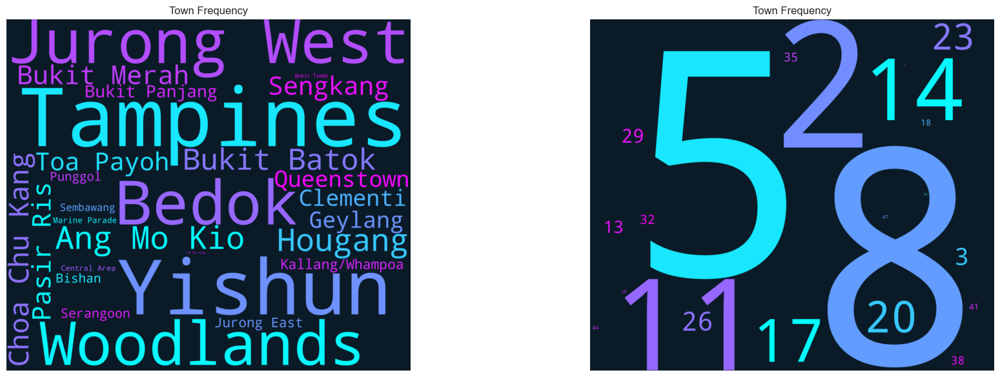

In [184]:
town = Counter(df1['town'])
full_address = Counter(df['Avg_storey_range'].astype('str'))

wordCloud_town = WordCloud(width= 2300, height = 2000, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_town.generate_from_frequencies(town)

# Add this line to create wordCloud_Flat_model
wordCloud_full_address = WordCloud(width= 2300, height = 2000, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_full_address.generate_from_frequencies(full_address)

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(wordCloud_town, interpolation='bilinear',cmap='Blues')
plt.title('Town Frequency')
plt.subplot(1,2,2)
plt.imshow(wordCloud_full_address, interpolation='bilinear')
plt.title('Town Frequency')
plt.axis('off')
plt.tight_layout()
plt.show()

In [211]:
df1.columns

Index(['town', 'flat_type', 'floor_area_sqm', 'flat_model',
       'lease_commence_date', 'resale_price', 'price_per_sqm', 'year',
       'month_number', 'full_address', 'remaining_lease_year',
       'Avg_storey_range'],
      dtype='object')

###   Resale Price Analysis 

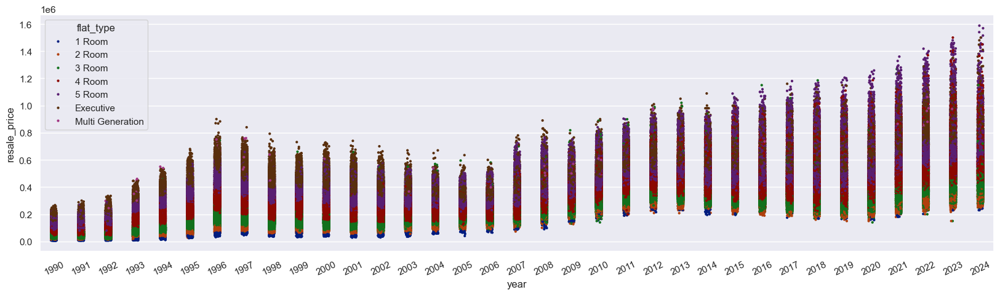

In [224]:
plt.figure(figsize=(20, 5))
sns.stripplot(data=df1, x="year", y="resale_price", hue="flat_type",palette='dark',s=3)
plt.xticks(rotation=25)
plt.show()

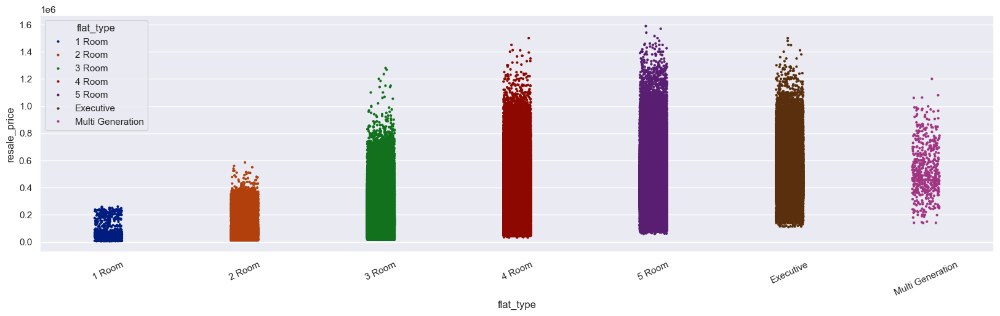

In [222]:
plt.figure(figsize=(20, 5))
sns.stripplot(data=df1, x="flat_type", y="resale_price", hue="flat_type",palette='dark',s=3, legend=True)
plt.xticks(rotation=25)
plt.show()

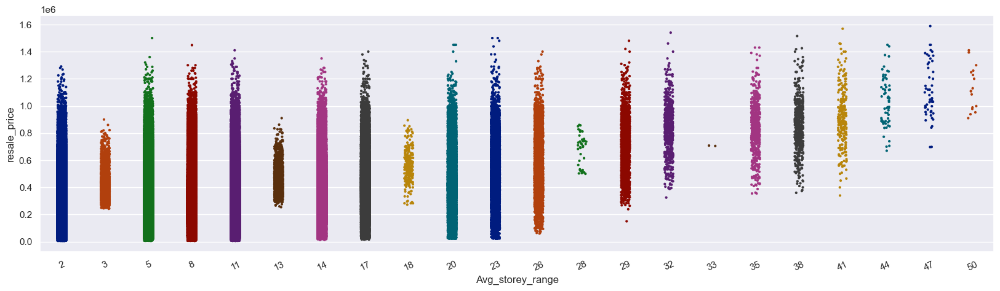

In [221]:
plt.figure(figsize=(20, 5))
sns.stripplot(data=df1, x="Avg_storey_range", y="resale_price", hue="Avg_storey_range",palette='dark',s=3, legend=False)
plt.xticks(rotation=25)
plt.show()

### Floor Area SQM Analysis 

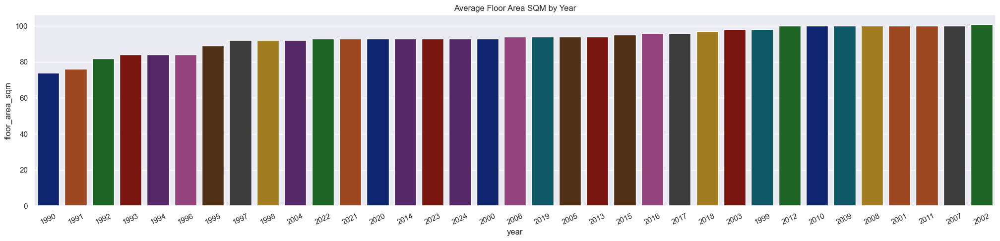

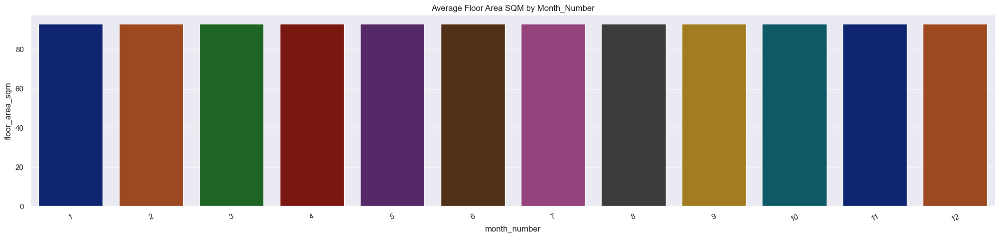

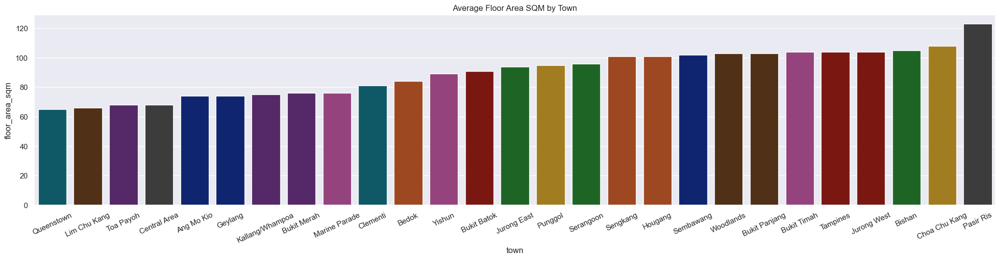

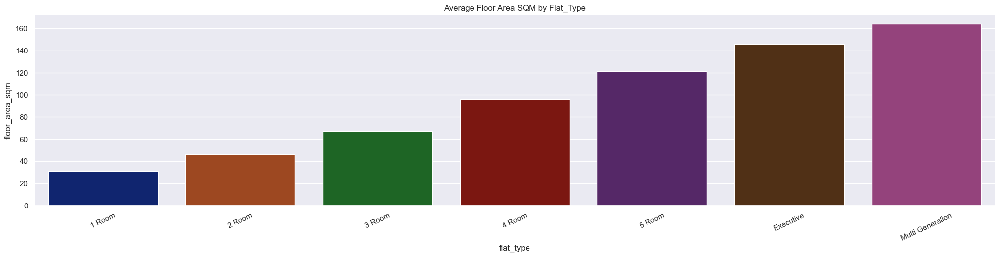

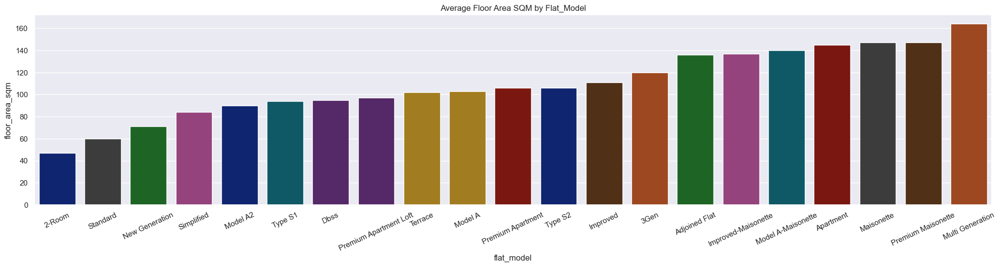

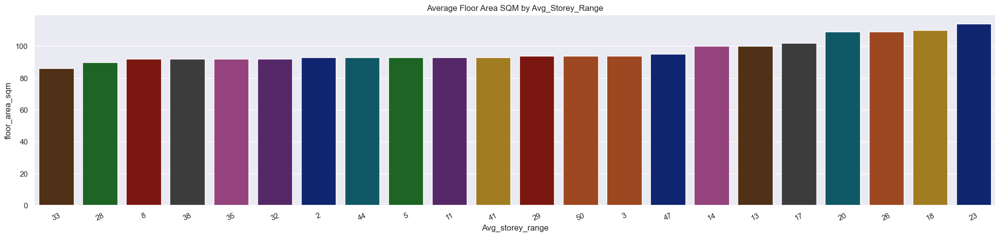

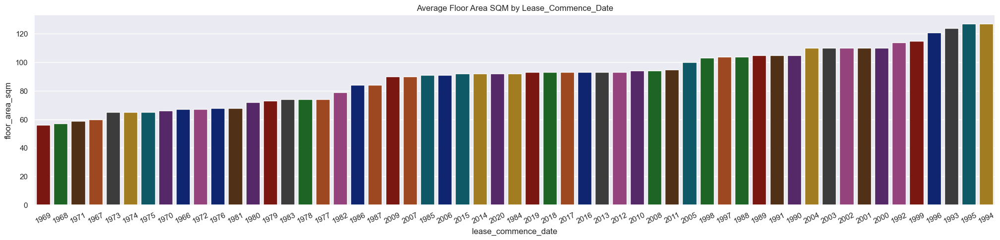

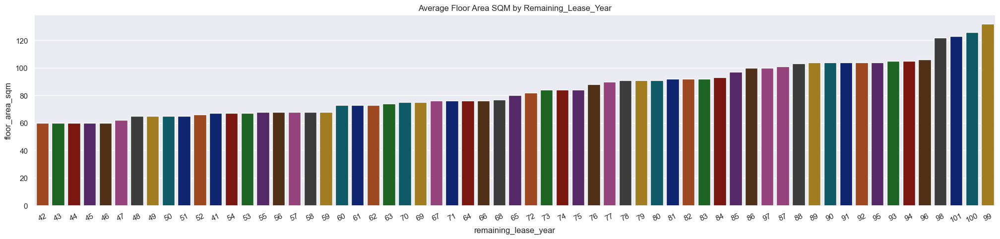

In [237]:
sns.set_theme( font_scale=1)  
categorical.remove('floor_area_sqm')
for i in categorical:
    plt.figure(figsize=(25, 5))
    data=df1.groupby(i,observed=False)['floor_area_sqm'].median().reset_index().sort_values('floor_area_sqm')
    sns.barplot(data=data, x=data[i], y=data['floor_area_sqm'],hue=i, order =data[i],legend=False,palette='dark',)
    plt.xticks(rotation=25)
    plt.title(f'Average Floor Area SQM by {i.title()}')
    plt.show()
categorical.append('floor_area_sqm')

### Relationship Between Continuous Features and Target

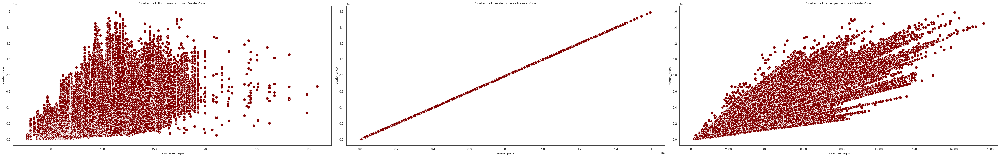

In [90]:
import math
sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1 ,color_codes=True, rc=None)
total_var=len(continuous)
plot_col=3
plot_row=math.ceil(total_var / 3)

fig, axes = plt.subplots(plot_row, plot_col, figsize=(50, 8))
axes = axes.flatten()
for i, var in  enumerate(continuous):
    sns.scatterplot(data=df1, x=var, y="resale_price", color='maroon',ax=axes[i],s=100)
    axes[i].set_title(f'Scatter plot: {var} vs Resale Price')

for i in range(i + 1, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

### Relationship Between Categorical Features and Target

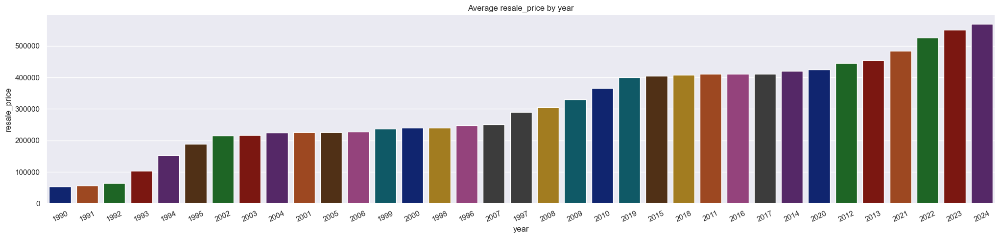

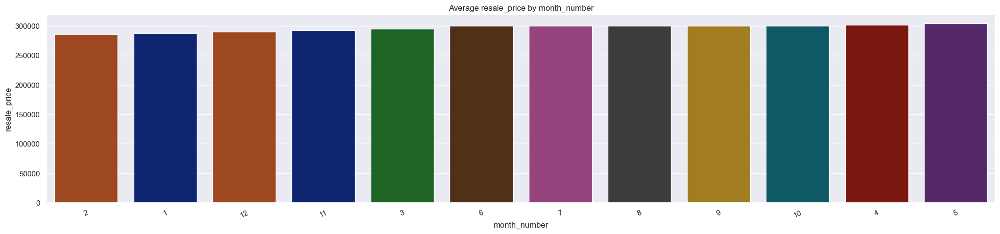

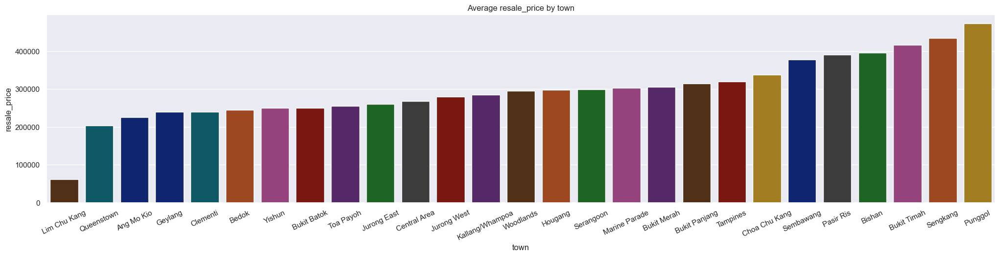

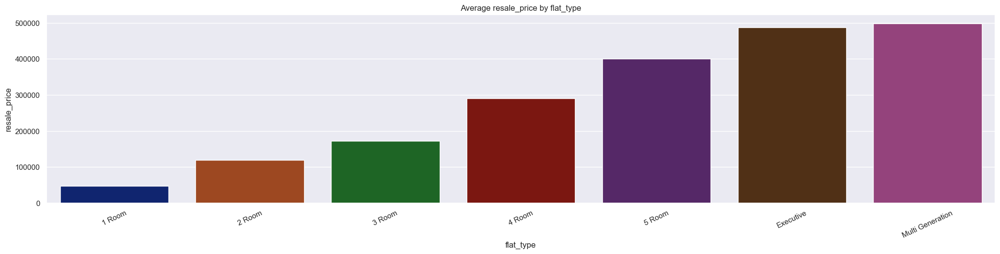

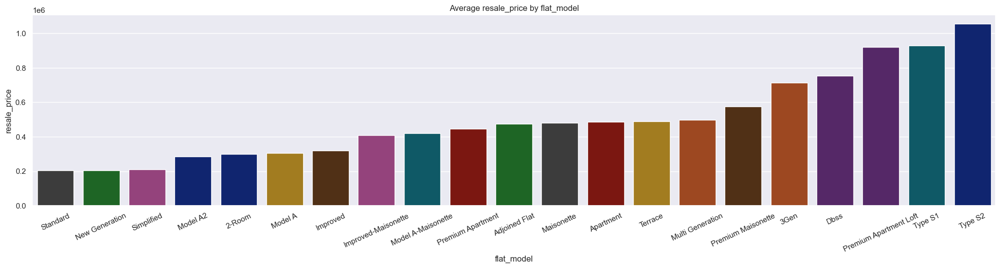

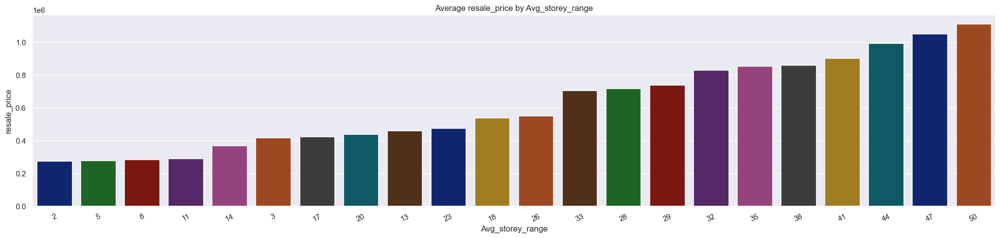

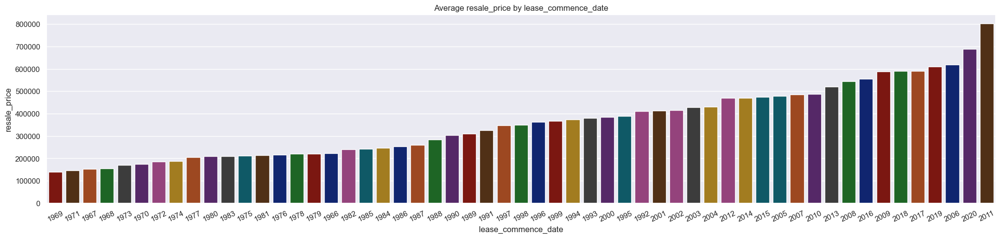

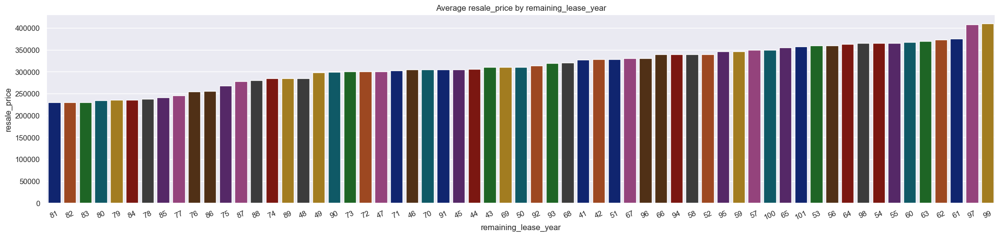

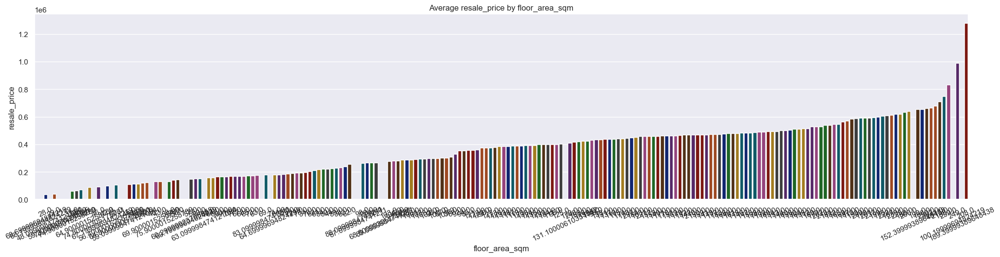

In [232]:
sns.set_theme( font_scale=1)  
for i in categorical:
    plt.figure(figsize=(25, 5))
    data=df1.groupby(i,observed=False)['resale_price'].median().reset_index().sort_values('resale_price')
    sns.barplot(data=data, x=data[i], y=data['resale_price'],hue=i, order =data[i],legend=False,palette='dark',)
    plt.xticks(rotation=25)
    plt.title(f'Average resale_price by {i}')
    plt.show()

### Pair Plot

<Figure size 1800x2000 with 0 Axes>

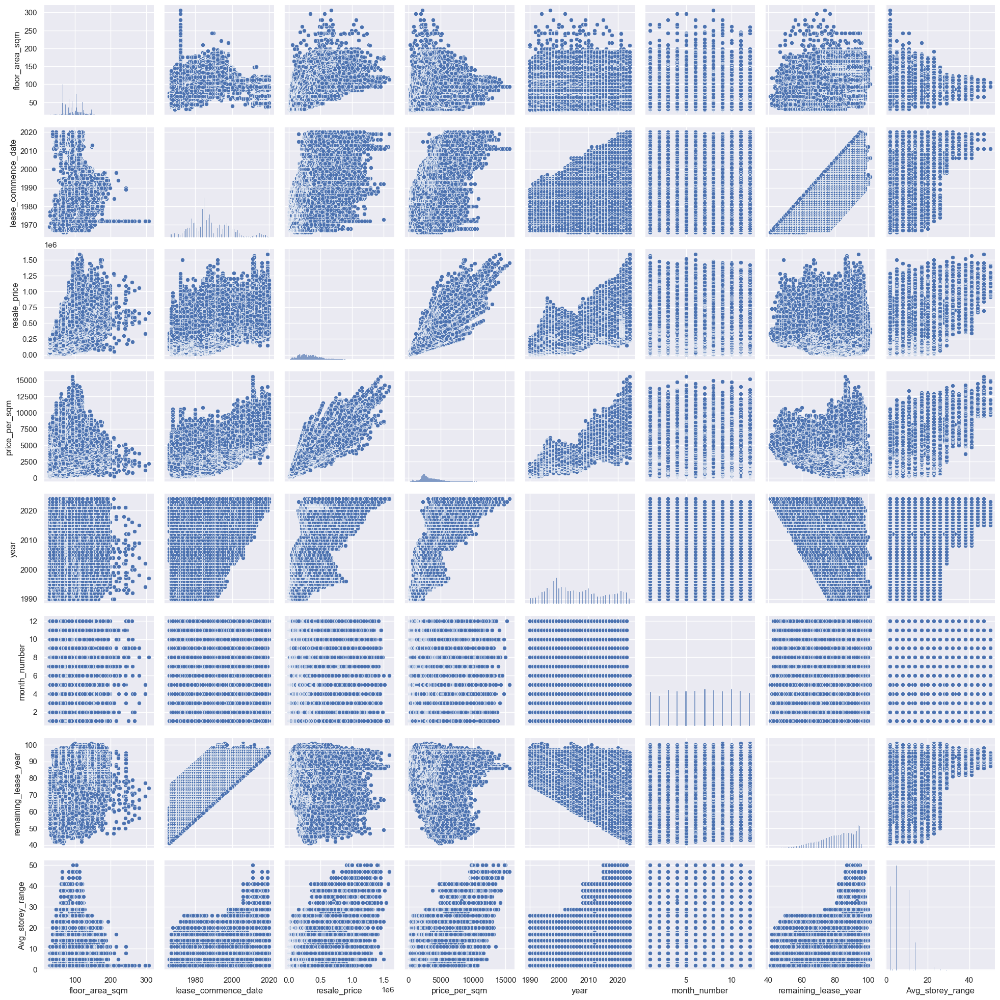

In [92]:
plt.figure(figsize=(18,20))
sns.pairplot(data=df1)
plt.show()

### Resale Price by Flat Type and Lease Commence Date

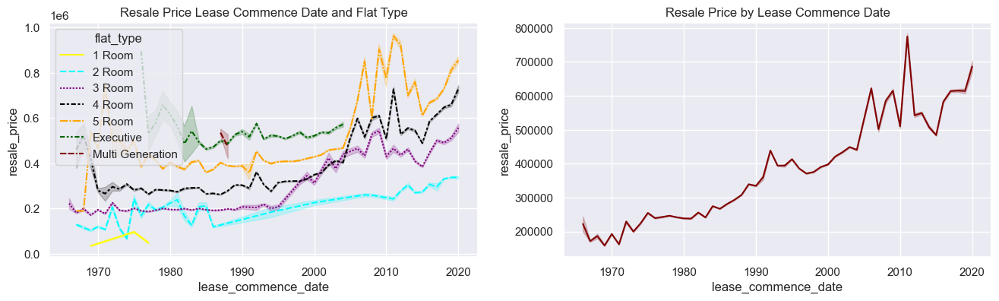

In [93]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='lease_commence_date', y = 'resale_price',hue='flat_type',style="flat_type",palette=['yellow','aqua','purple','black','orange','darkgreen','maroon'])
plt.title("Resale Price Lease Commence Date and Flat Type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='lease_commence_date', y = 'resale_price',color='maroon')
plt.title("Resale Price by Lease Commence Date")

plt.show()

### Resale Price by Year and Flat Type

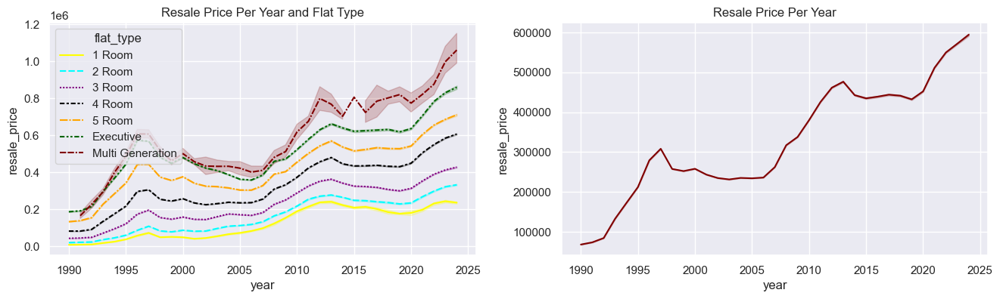

In [94]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='year', y = 'resale_price',hue='flat_type',style="flat_type",palette=['yellow','aqua','purple','black','orange','darkgreen','maroon'])
plt.title("Resale Price Per Year and Flat Type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='year', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

### Resale Price by Avg_storey_range and Flat Type

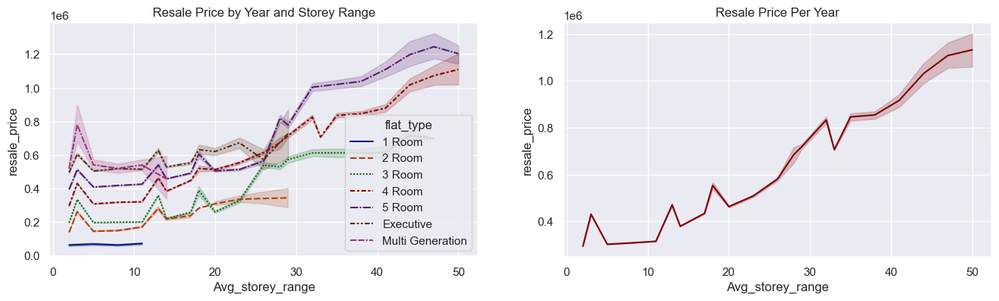

In [95]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='Avg_storey_range', y = 'resale_price',hue='flat_type',style="flat_type",palette='dark')
plt.title("Resale Price by Year and Storey Range")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='Avg_storey_range', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

### Resale Price by remaining_lease_year and Flat Type

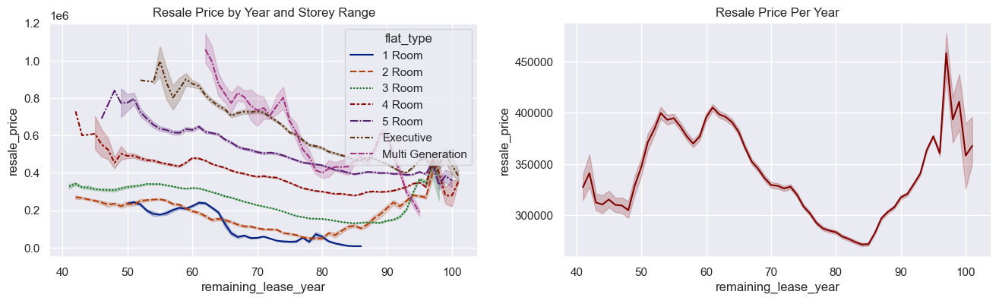

In [96]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='remaining_lease_year', y = 'resale_price',hue='flat_type',style="flat_type",palette='dark')
plt.title("Resale Price by Year and Storey Range")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='remaining_lease_year', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

### Normality Test

In [97]:
continuous = ['floor_area_sqm', 'price_per_sqm', 'resale_price',]

for var in continuous:
    stat, p = kstest(df1[var], 'norm', args=(df1[var].mean(), df1[var].std()))
    print(f'K-S Test for {var}: Statistics={stat}, p={p}')
    if p > 0.05:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')


K-S Test for floor_area_sqm: Statistics=0.09941099273674198, p=0.0
floor_area_sqm does not look normally distributed.

K-S Test for price_per_sqm: Statistics=0.09489535653294501, p=0.0
price_per_sqm does not look normally distributed.

K-S Test for resale_price: Statistics=0.059450367412785865, p=0.0
resale_price does not look normally distributed.



In [98]:
from scipy.stats import skew, kurtosis

for var in continuous:
    skewness = skew(df1[var])
    kurt = kurtosis(df1[var])
    print(f'{var} - Skewness: {skewness}, Kurtosis: {kurt}')
    if abs(skewness) < 0.5 and abs(kurt) < 3:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')

floor_area_sqm - Skewness: 0.3660709490993199, Kurtosis: -0.34641220087085633
floor_area_sqm looks normally distributed.

price_per_sqm - Skewness: 1.0728419731408791, Kurtosis: 2.0848609936408025
price_per_sqm does not look normally distributed.

resale_price - Skewness: 0.9421620158728324, Kurtosis: 1.373502157753908
resale_price does not look normally distributed.



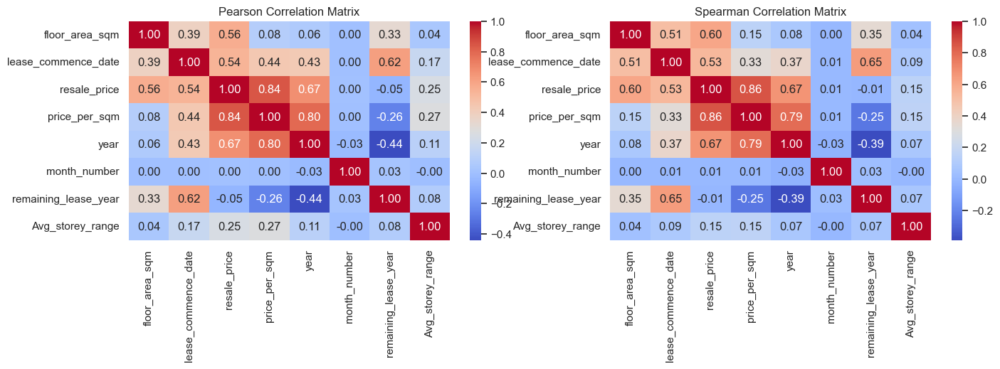

In [99]:
cor_col = df1.select_dtypes(include='number')
correlation_matrix_pear = cor_col.corr()
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
sns.heatmap(correlation_matrix_pear,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Pearson Correlation Matrix')


cor_col = df1.select_dtypes(include='number')
correlation_matrix = cor_col.corr(method='spearman')
plt.subplot(1,2,2)
sns.heatmap(correlation_matrix,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Spearman Correlation Matrix')
plt.show()

### Experimenting with a few types of data transformation techniques to see which one suits best.

In [100]:
skew_dict=dict(df1[continuous].skew())
skew_dict

{'floor_area_sqm': 0.3660726547241211,
 'price_per_sqm': 1.072843708264345,
 'resale_price': 0.942163539645637}

In [101]:
def boxcox_transform(x):
    # Perform Box-Cox transformation
    transformed_data,lmbda = boxcox(x)
    return transformed_data,lmbda

In [102]:
method_functions =  {
    'log': np.log,
    'square': np.sqrt,
    'rec': lambda x: 1 / x,
    'sig': lambda x: 1 / (1 + np.exp(-x)),
    'pow': lambda x: np.power(x, 2),
    'exp':lambda x: x**(1/5),
    'boxcox': boxcox_transform,
        }

def skewness_checker(df, column, method):
    normalized_df=pd.DataFrame()

    for method_name, func in method_functions.items():
        for col in column:

            new_column = f'{col}_{method_name}'
            if method_name in ['boxcox']:
                transformed_values = func(df[col])[0]
            else:
                transformed_values = func(df[col])
            normalized_df[new_column] = transformed_values

    return normalized_df

In [103]:
normalized_df=skewness_checker(df1, continuous, method_functions)
normalized_df

,floor_area_sqm_log,price_per_sqm_log,resale_price_log,floor_area_sqm_square,price_per_sqm_square,resale_price_square,floor_area_sqm_rec,price_per_sqm_rec,resale_price_rec,floor_area_sqm_sig,...,resale_price_sig,floor_area_sqm_pow,price_per_sqm_pow,resale_price_pow,floor_area_sqm_exp,price_per_sqm_exp,resale_price_exp,floor_area_sqm_boxcox,price_per_sqm_boxcox,resale_price_boxcox
0,3.433987,5.670993,9.104980,5.567764,17.038855,94.868330,0.032258,0.003444,0.000111,1.0,...,1.0,961.0,8.428720e+04,8.100000e+07,1.987341,3.108681,6.178009,6.587979,21.894497,121.361730
1,3.433987,5.265528,8.699515,5.567764,13.912167,77.459667,0.032258,0.005167,0.000167,1.0,...,1.0,961.0,3.746098e+04,3.600000e+07,1.987341,2.866539,5.696791,6.587979,18.221192,101.219221
2,3.433987,5.553210,8.987197,5.567764,16.064387,89.442719,0.032258,0.003875,0.000125,1.0,...,1.0,961.0,6.659729e+04,6.400000e+07,1.987341,3.036307,6.034176,6.587979,20.764940,115.137064
3,3.433987,5.265528,8.699515,5.567764,13.912167,77.459667,0.032258,0.005167,0.000167,1.0,...,1.0,961.0,3.746098e+04,3.600000e+07,1.987341,2.866539,5.696791,6.587979,18.221192,101.219221
4,4.290460,6.471690,10.762149,8.544003,25.427846,217.255610,0.013699,0.001547,0.000021,1.0,...,1.0,5329.0,4.180597e+05,2.227840e+09,2.358656,3.648580,8.605744,9.854501,31.172901,253.462028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181257,4.718499,8.793200,13.511699,10.583005,81.174415,859.069264,0.008929,0.000152,0.000001,1.0,...,1.0,12544.0,4.341869e+07,5.446440e+11,2.569470,5.804538,14.914588,11.887237,83.257104,851.806692
181258,4.804021,8.625827,13.429848,11.045361,74.657689,824.621125,0.008197,0.000179,0.000001,1.0,...,1.0,14884.0,3.106692e+07,4.624000e+11,2.613798,5.613449,14.672421,12.330686,77.667051,821.691136
181259,4.983607,8.596182,13.579788,12.083046,73.559220,888.819442,0.006849,0.000185,0.000001,1.0,...,1.0,21316.0,2.927848e+07,6.241000e+11,2.709384,5.580265,15.119082,13.305649,76.715625,877.695774
181260,4.983607,8.831904,13.815511,12.083046,82.760589,1000.000000,0.006849,0.000146,0.000001,1.0,...,1.0,21316.0,4.691312e+07,1.000000e+12,2.709384,5.849644,15.848932,13.305649,84.604299,973.536477


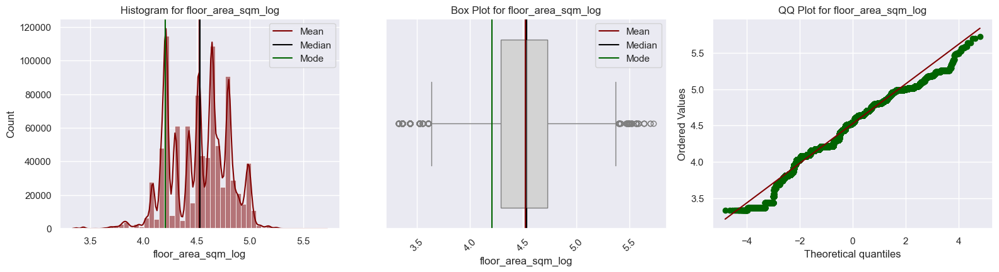



Skew for floor_area_sqm_log is -0.23

Kurtosis for floor_area_sqm_log is -0.36




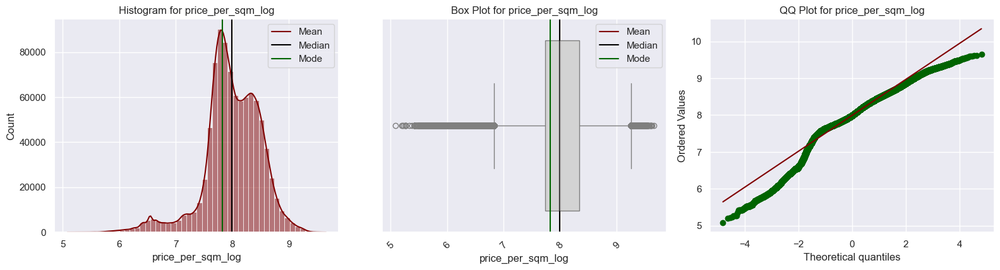



Skew for price_per_sqm_log is -0.82

Kurtosis for price_per_sqm_log is 1.87




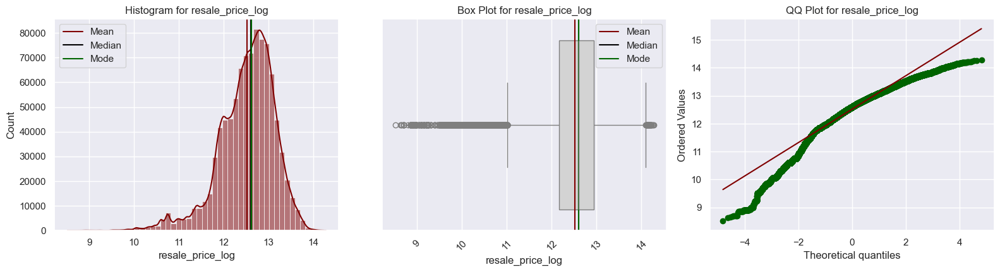



Skew for resale_price_log is -0.92

Kurtosis for resale_price_log is 1.61




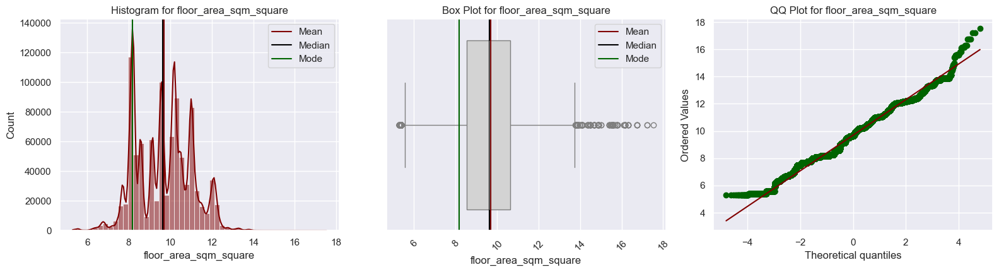



Skew for floor_area_sqm_square is 0.08

Kurtosis for floor_area_sqm_square is -0.57




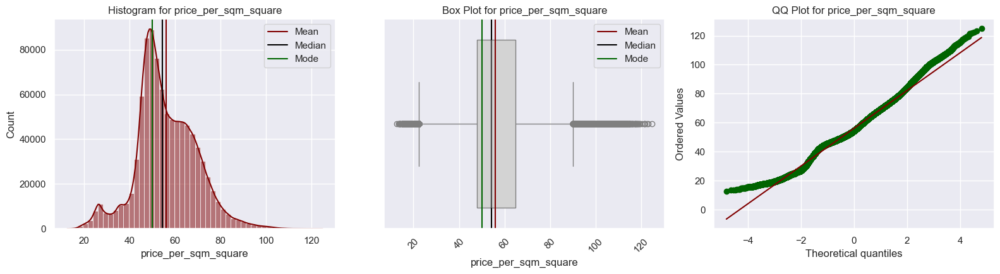



Skew for price_per_sqm_square is 0.22

Kurtosis for price_per_sqm_square is 0.57




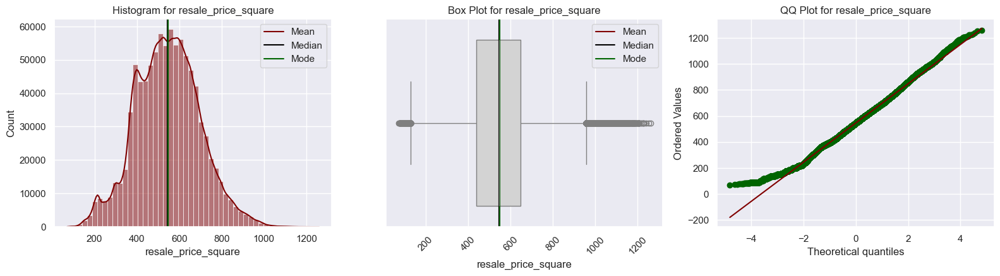



Skew for resale_price_square is 0.11

Kurtosis for resale_price_square is 0.05




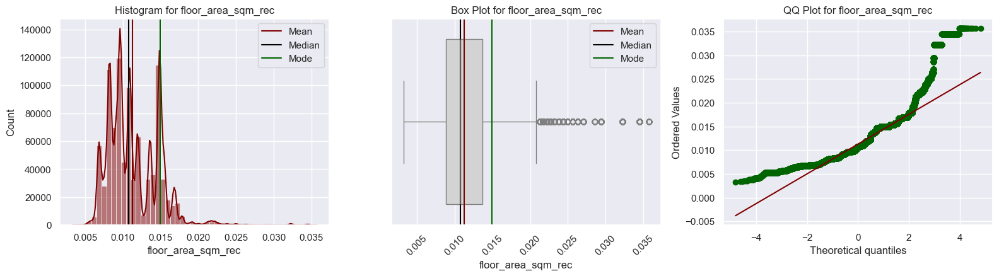



Skew for floor_area_sqm_rec is 1.10

Kurtosis for floor_area_sqm_rec is 3.00




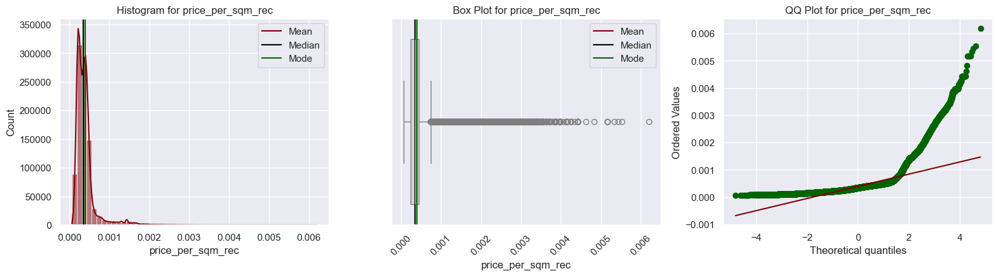



Skew for price_per_sqm_rec is 4.09

Kurtosis for price_per_sqm_rec is 24.62




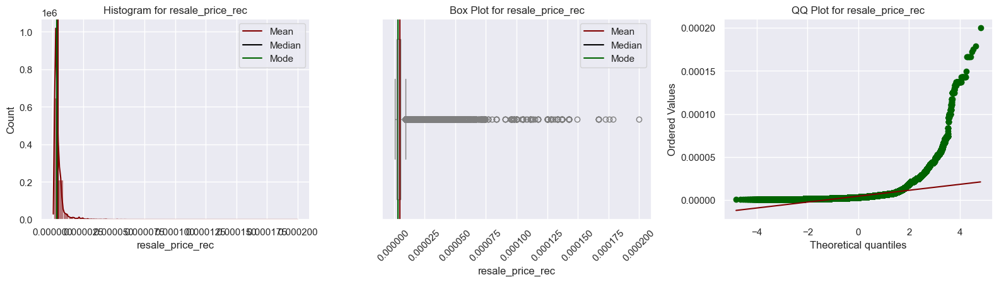



Skew for resale_price_rec is 7.24

Kurtosis for resale_price_rec is 112.40




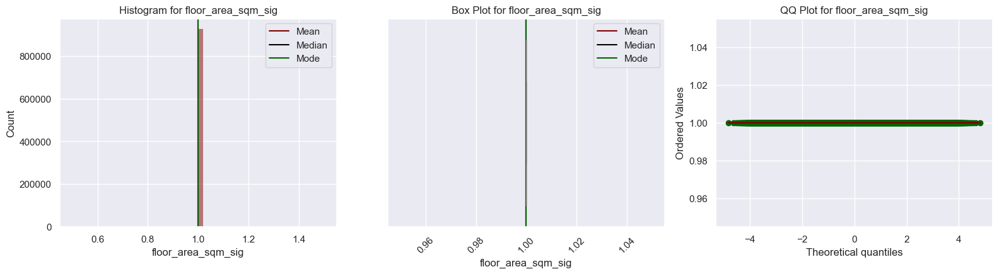



Skew for floor_area_sqm_sig is 0.00

Kurtosis for floor_area_sqm_sig is 0.00




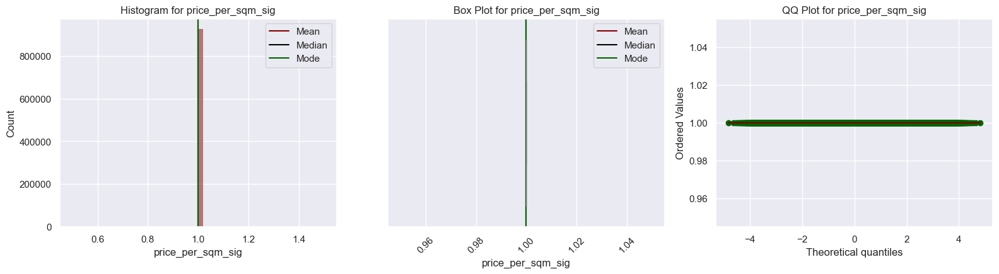



Skew for price_per_sqm_sig is 0.00

Kurtosis for price_per_sqm_sig is 0.00




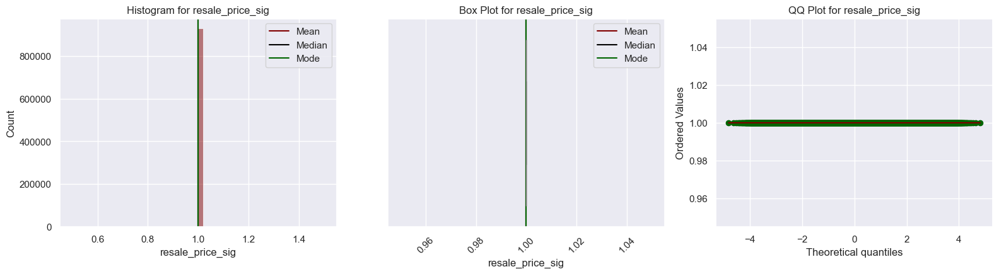



Skew for resale_price_sig is 0.00

Kurtosis for resale_price_sig is 0.00




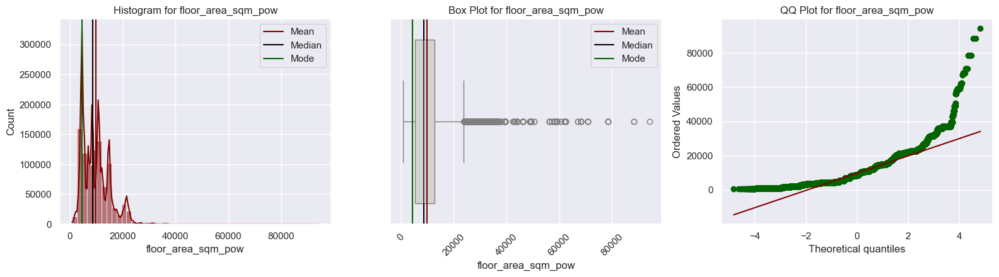



Skew for floor_area_sqm_pow is 1.00

Kurtosis for floor_area_sqm_pow is 1.66




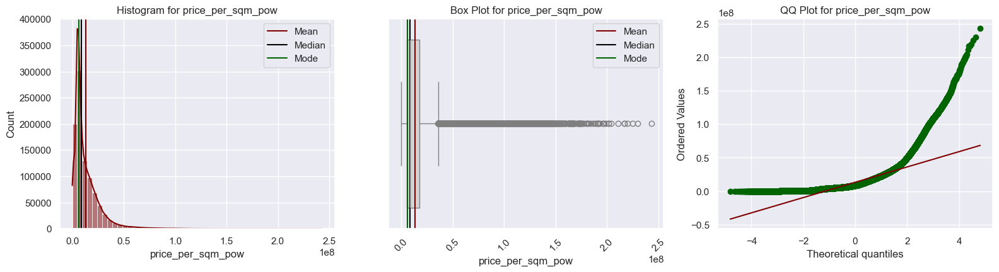



Skew for price_per_sqm_pow is 2.99

Kurtosis for price_per_sqm_pow is 14.96




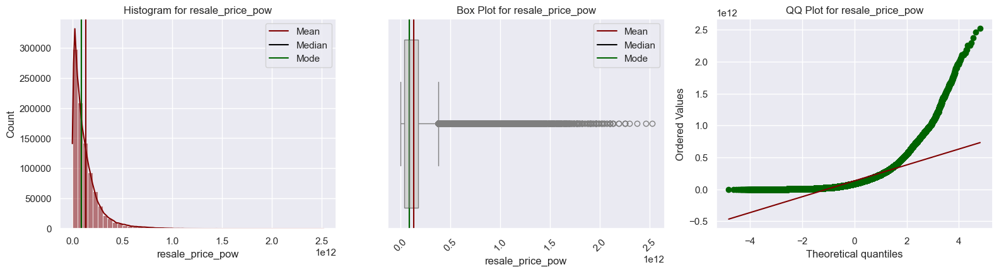



Skew for resale_price_pow is 2.81

Kurtosis for resale_price_pow is 13.23




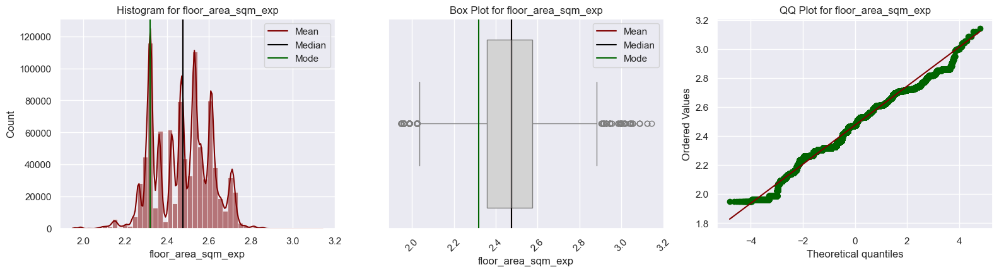



Skew for floor_area_sqm_exp is -0.11

Kurtosis for floor_area_sqm_exp is -0.50




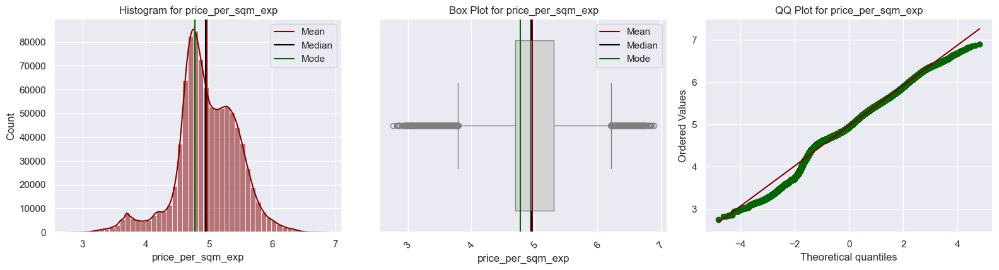



Skew for price_per_sqm_exp is -0.37

Kurtosis for price_per_sqm_exp is 0.93




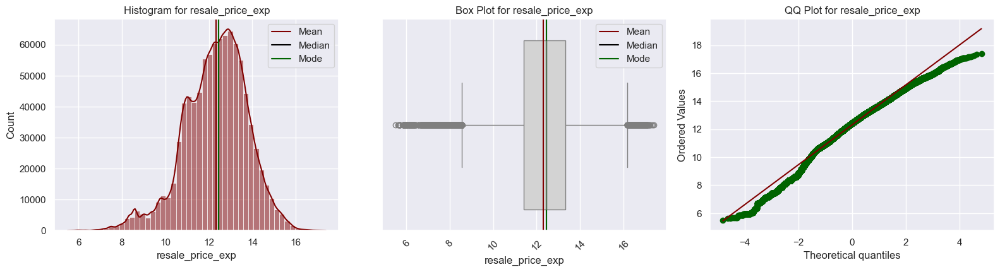



Skew for resale_price_exp is -0.46

Kurtosis for resale_price_exp is 0.48




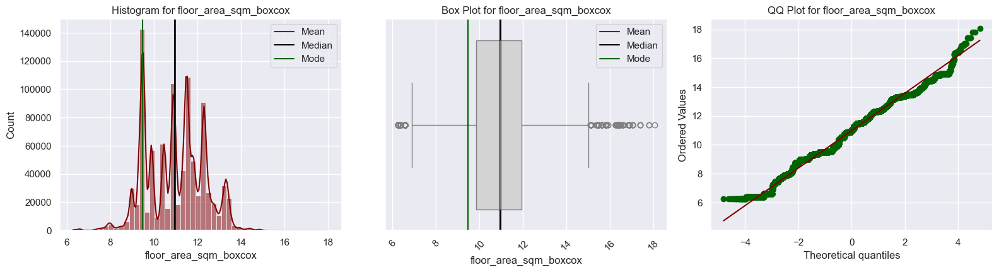



Skew for floor_area_sqm_boxcox is -0.02

Kurtosis for floor_area_sqm_boxcox is -0.55




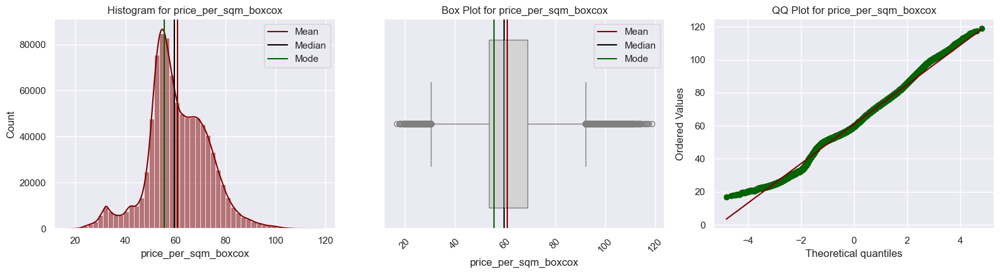



Skew for price_per_sqm_boxcox is 0.04

Kurtosis for price_per_sqm_boxcox is 0.57




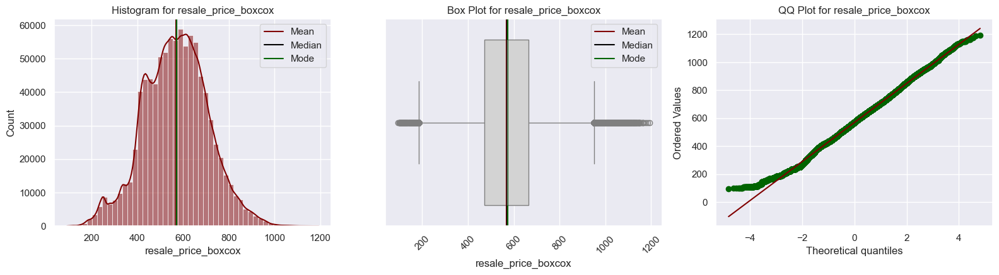



Skew for resale_price_boxcox is -0.00

Kurtosis for resale_price_boxcox is 0.05


Skewness:
 {'floor_area_sqm_log': -0.23334388, 'price_per_sqm_log': -0.8184514040088072, 'resale_price_log': -0.9240431018462136, 'floor_area_sqm_square': 0.07508402, 'price_per_sqm_square': 0.218400005682388, 'resale_price_square': 0.10918464819090822, 'floor_area_sqm_rec': 1.1036736, 'price_per_sqm_rec': 4.092842125511875, 'resale_price_rec': 7.24332894254145, 'floor_area_sqm_sig': 0.0, 'price_per_sqm_sig': 0.0, 'resale_price_sig': 0.0, 'floor_area_sqm_pow': 1.0026332, 'price_per_sqm_pow': 2.9859800621469907, 'resale_price_pow': 2.810519042318628, 'floor_area_sqm_exp': -0.10569635, 'price_per_sqm_exp': -0.3680042268192765, 'resale_price_exp': -0.4641821320745675, 'floor_area_sqm_boxcox': -0.01673124, 'price_per_sqm_boxcox': 0.03794701531258612, 'resale_price_boxcox': -0.0005540245162536535} 

 Kurtois:
 {'floor_area_sqm_log': -0.35770032, 'price_per_sqm_log': 1.868267357554061, 'resale_price_log': 1.6

In [104]:
transformed_skewness = {}
transformed_kurtosis = {}
for i in normalized_df.columns:
    univar_num(normalized_df,i)
    skews=normalized_df[i].skew()
    kurt=normalized_df[i].kurtosis()
    transformed_skewness.update({i:skews})
    transformed_kurtosis.update({i:kurt})
    color = color_neutral
    if -0.5 <= skews <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skews <= 0.5 or -0.5 < skews < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
      
    print(f"\n\n{color}Skew for {i} is {skews:.2f}{color_neutral}")    
    print(f"\n{color}Kurtosis for {i} is {kurt:.2f}{color_neutral}\n\n")
print( 'Skewness:\n',transformed_skewness,'\n\n','Kurtois:\n',transformed_kurtosis)

## Handling Outliers

### Function to handle outliers based on categorical variables

In [111]:
def handle_outliers_improved(df, continuous_var, categorical_vars, iqr_multiplier=1.5):
    df_copy = df.copy()
    outlier_count = 0
    
    # Group by all categorical variables at once
    grouped = df_copy.groupby(categorical_vars,observed=False)
    
    def replace_outliers(group):
        nonlocal outlier_count
        Q1 = group[continuous_var].quantile(0.25)
        Q3 = group[continuous_var].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - iqr_multiplier * IQR
        upper_bound = Q3 + iqr_multiplier * IQR
        
        # Count outliers
        outliers = (group[continuous_var] < lower_bound) | (group[continuous_var] > upper_bound)
        outlier_count += outliers.sum()
        
        # Cap outliers instead of replacing with median
        group.loc[group[continuous_var] < lower_bound, continuous_var] = lower_bound
        group.loc[group[continuous_var] > upper_bound, continuous_var] = upper_bound
        
        return group[continuous_var]

    # Apply the function and update only the continuous variable
    df_copy[continuous_var] = grouped[continuous_var].transform(replace_outliers)
    
    print(f"Total outliers handled: {outlier_count}")
    return df_copy

### List of categorical variables that influence resale_price

In [112]:
categorical_vars = ['town', 'flat_type', 'flat_model', 'Avg_storey_range', 'year']

### Apply the function to handle outliers

In [113]:
df1_cleaned = handle_outliers(df1, 'resale_price', categorical_vars)

C:\Users\sansu\AppData\Local\Temp\ipykernel_14812\2390348279.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_copy.groupby(categorical_vars)


Total outliers handled: 28827


C:\Users\sansu\AppData\Local\Temp\ipykernel_14812\2390348279.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_copy = grouped.apply(replace_outliers)


## Exploratory Data Analysis. After Handling Skewness and Outliers

In [ ]:
color_good = '\033[32m'  # Dark Green for good skew
color_okay = '\033[92m'  # Light Green for okay skew
color_bad = '\033[91m'  # Maroon for bad skew
color_neutral = '\033[0m'  # Reset color

skewed_col = []

sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)  

for i in df1.select_dtypes(include='number'):
    univar_num(df1,i) 
    skew_val = df1[i].skew()
    
    if -0.5 <= skew_val <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skew_val <= 0.5 or -0.5 < skew_val < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
        skewed_col.append(i)

    print(f"\n{color}Skew for {i} is {skew_val:.2f}{color_neutral}\n")

In [114]:
normalized_df_cleaned=skewness_checker(df1_cleaned, continuous, method_functions)
normalized_df_cleaned

,floor_area_sqm_log,price_per_sqm_log,resale_price_log,floor_area_sqm_square,price_per_sqm_square,resale_price_square,floor_area_sqm_rec,price_per_sqm_rec,resale_price_rec,floor_area_sqm_sig,...,resale_price_sig,floor_area_sqm_pow,price_per_sqm_pow,resale_price_pow,floor_area_sqm_exp,price_per_sqm_exp,resale_price_exp,floor_area_sqm_boxcox,price_per_sqm_boxcox,resale_price_boxcox
0,3.433987,5.553210,8.987197,5.567764,16.064387,89.442719,0.032258,0.003875,1.250000e-04,1.0,...,1.0,961.0,6.659729e+04,6.400000e+07,1.987341,3.036307,6.034176,6.574419,20.764940,115.875604
1,3.433987,5.196535,8.630522,5.567764,13.440430,74.833148,0.032258,0.005536,1.785714e-04,1.0,...,1.0,961.0,3.263267e+04,3.136000e+07,1.987341,2.827257,5.618723,6.574419,17.653728,98.733277
2,3.433987,5.670993,9.104980,5.567764,17.038855,94.868330,0.032258,0.003444,1.111111e-04,1.0,...,1.0,961.0,8.428720e+04,8.100000e+07,1.987341,3.108681,6.178009,6.574419,21.894496,122.152774
3,3.433987,5.265528,8.699515,5.567764,13.912167,77.459667,0.032258,0.005167,1.666667e-04,1.0,...,1.0,961.0,3.746098e+04,3.600000e+07,1.987341,2.866539,5.696791,6.574419,18.221192,101.842977
4,3.433987,5.265528,8.699515,5.567764,13.912167,77.459667,0.032258,0.005167,1.666667e-04,1.0,...,1.0,961.0,3.746098e+04,3.600000e+07,1.987341,2.866539,5.696791,6.574419,18.221192,101.842977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
927460,5.099866,8.897966,13.997832,12.806249,85.539892,1095.445115,0.006098,0.000137,8.333333e-07,1.0,...,1.0,26896.0,5.353956e+07,1.440000e+12,2.773121,5.927444,16.437518,13.924106,86.952847,1066.337357
927461,5.093750,7.184643,12.278393,12.767145,36.318293,463.680925,0.006135,0.000758,4.651163e-06,1.0,...,1.0,26569.0,1.739810e+06,4.622500e+10,2.769731,4.207752,11.654340,13.888675,42.369246,499.639401
927462,5.068904,7.927442,12.996347,12.609520,52.652892,663.927707,0.006289,0.000361,2.268603e-06,1.0,...,1.0,25281.0,7.685797e+06,1.943046e+11,2.756001,4.881675,13.453904,13.745511,58.013293,685.847765
927463,5.093750,7.877790,12.971540,12.767145,51.361822,655.743852,0.006135,0.000379,2.325581e-06,1.0,...,1.0,26569.0,6.959238e+06,1.849000e+11,2.769731,4.833438,13.387321,13.888675,56.815359,678.386485


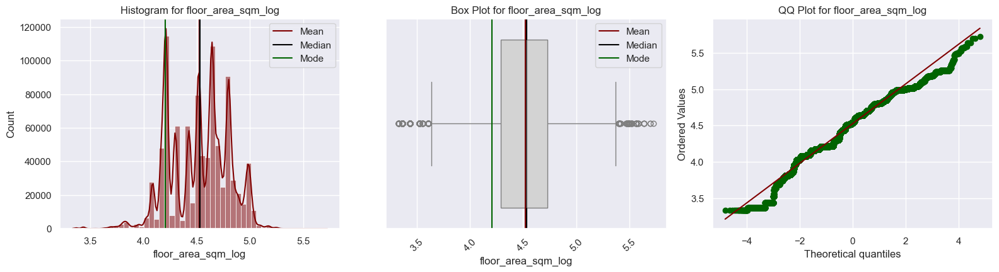



Skew for floor_area_sqm_log is -0.23

Kurtosis for floor_area_sqm_log is -0.36




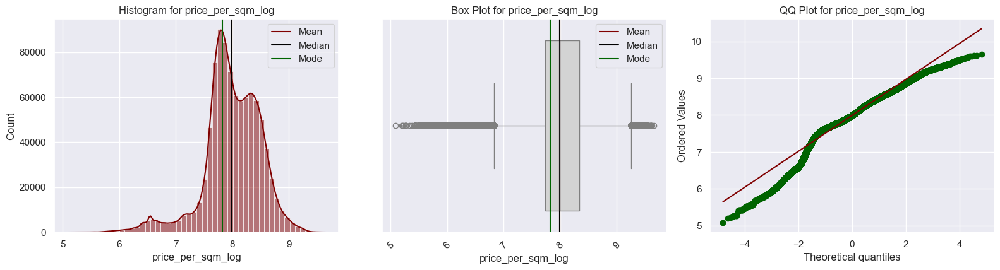



Skew for price_per_sqm_log is -0.82

Kurtosis for price_per_sqm_log is 1.87




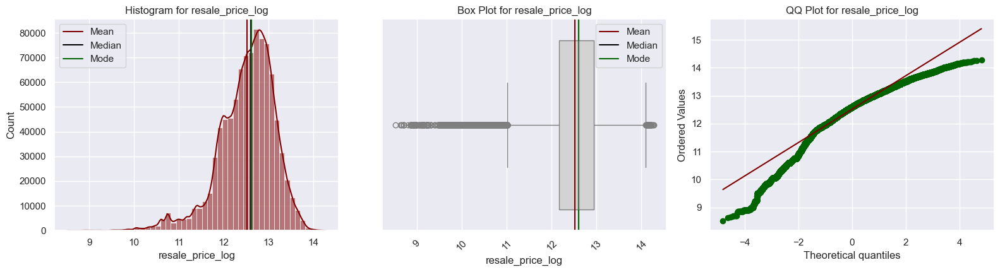



Skew for resale_price_log is -0.92

Kurtosis for resale_price_log is 1.60




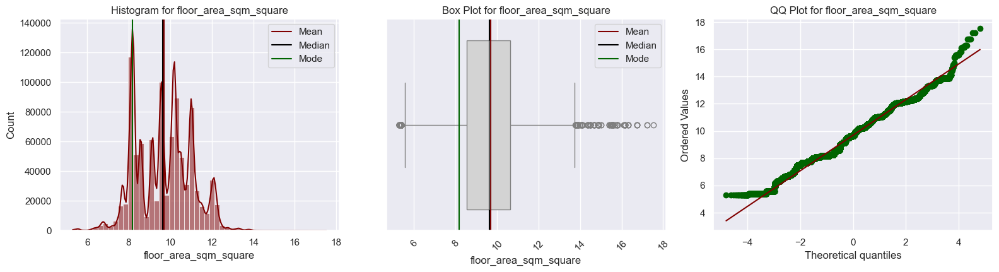



Skew for floor_area_sqm_square is 0.08

Kurtosis for floor_area_sqm_square is -0.57




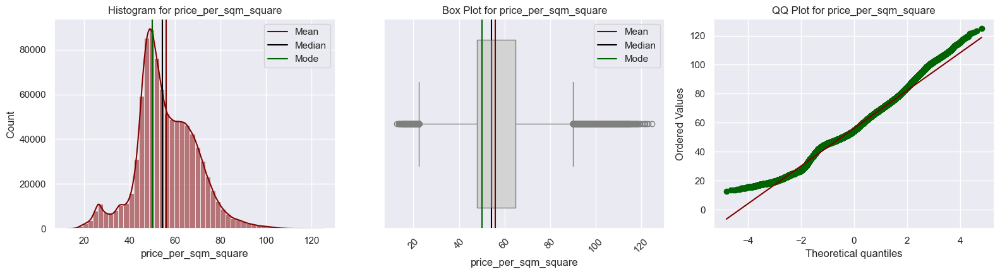



Skew for price_per_sqm_square is 0.22

Kurtosis for price_per_sqm_square is 0.57




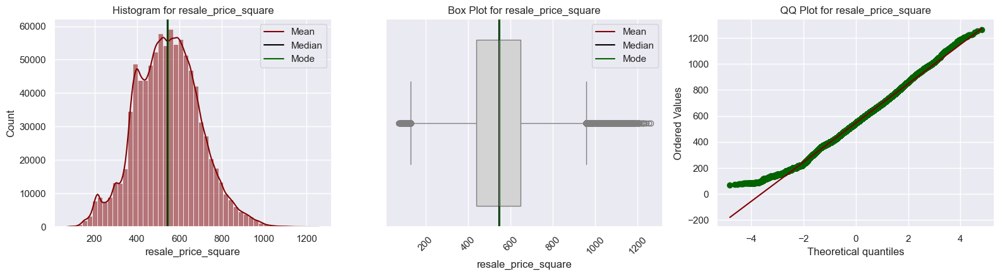



Skew for resale_price_square is 0.11

Kurtosis for resale_price_square is 0.05




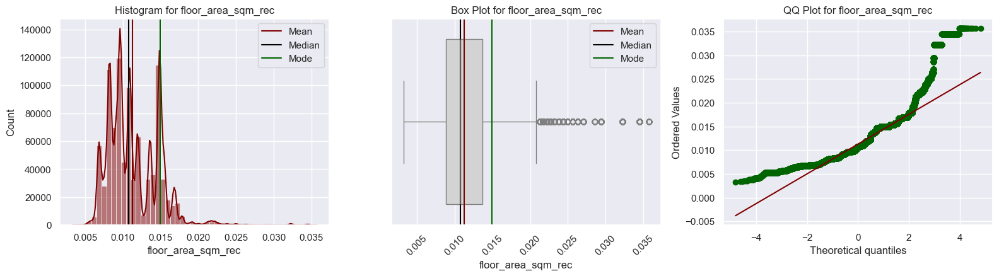



Skew for floor_area_sqm_rec is 1.10

Kurtosis for floor_area_sqm_rec is 3.00




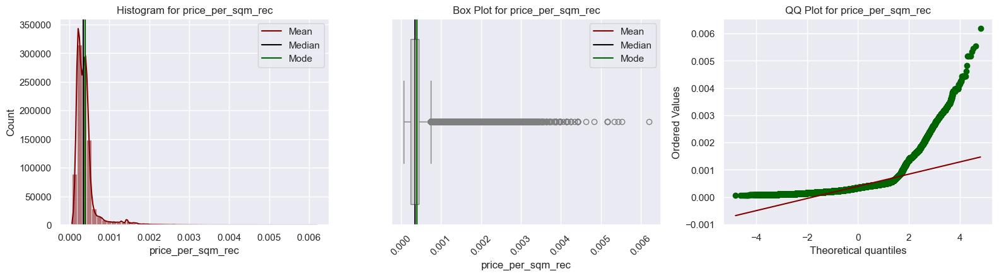



Skew for price_per_sqm_rec is 4.09

Kurtosis for price_per_sqm_rec is 24.62




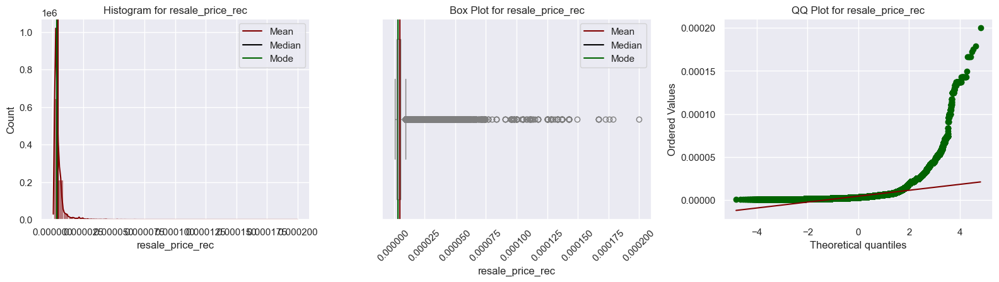



Skew for resale_price_rec is 7.24

Kurtosis for resale_price_rec is 112.54




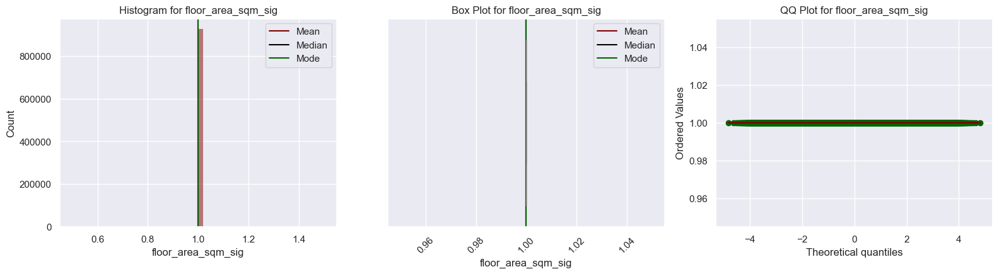



Skew for floor_area_sqm_sig is 0.00

Kurtosis for floor_area_sqm_sig is 0.00




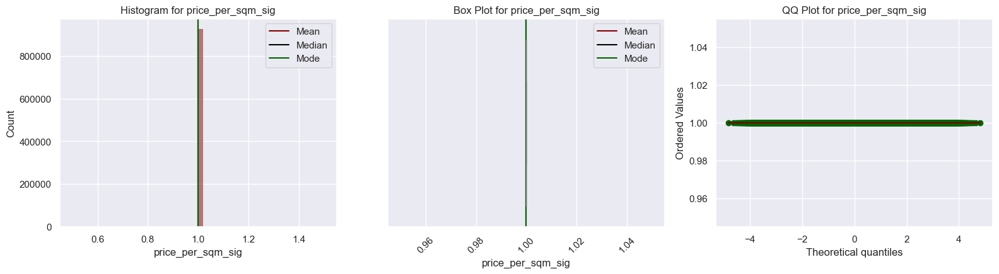



Skew for price_per_sqm_sig is 0.00

Kurtosis for price_per_sqm_sig is 0.00




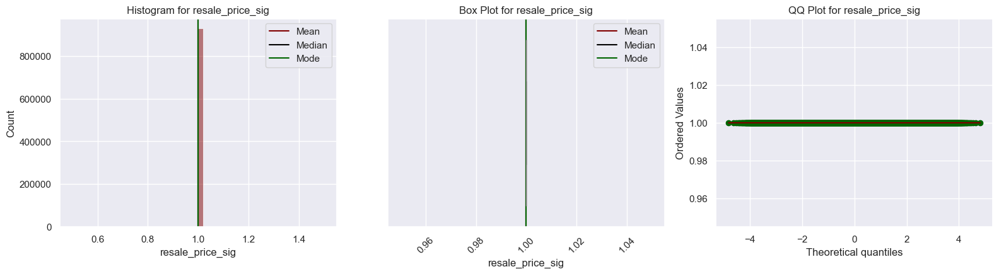



Skew for resale_price_sig is 0.00

Kurtosis for resale_price_sig is 0.00




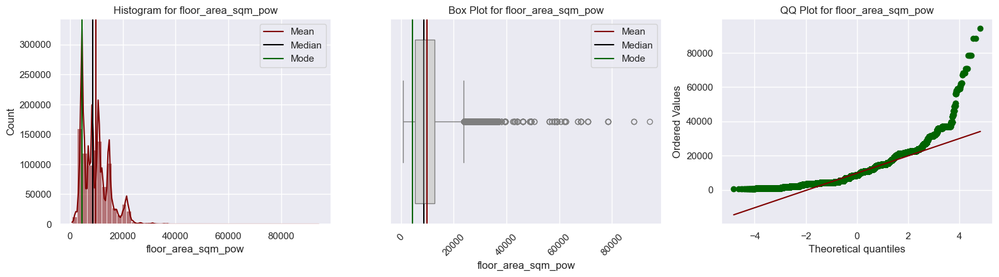



Skew for floor_area_sqm_pow is 1.00

Kurtosis for floor_area_sqm_pow is 1.66




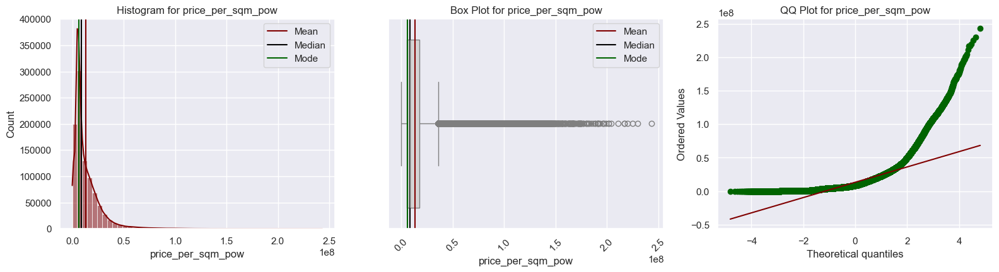



Skew for price_per_sqm_pow is 2.99

Kurtosis for price_per_sqm_pow is 14.96




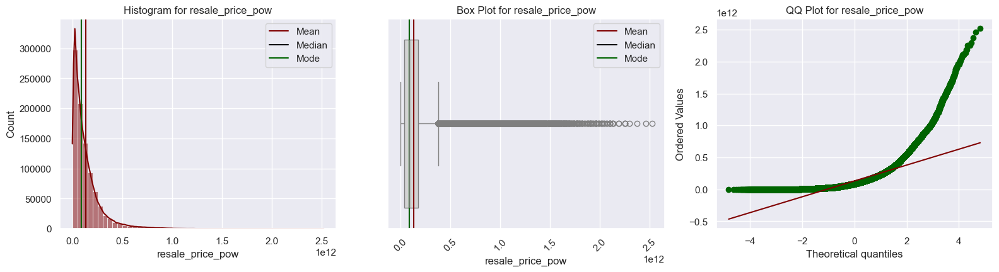



Skew for resale_price_pow is 2.80

Kurtosis for resale_price_pow is 13.14




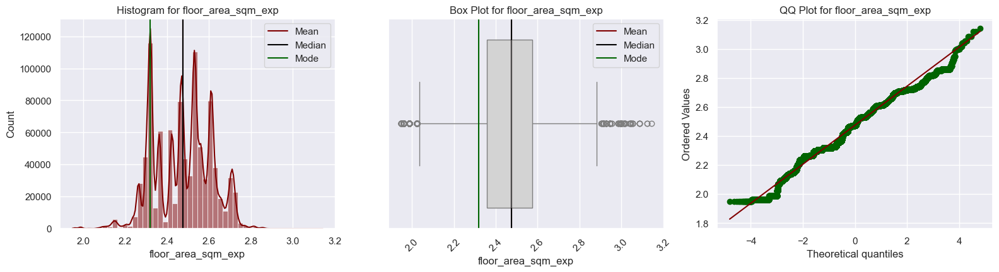



Skew for floor_area_sqm_exp is -0.11

Kurtosis for floor_area_sqm_exp is -0.50




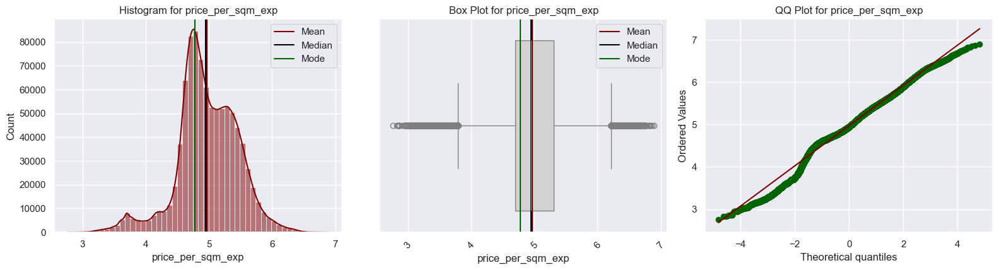



Skew for price_per_sqm_exp is -0.37

Kurtosis for price_per_sqm_exp is 0.93




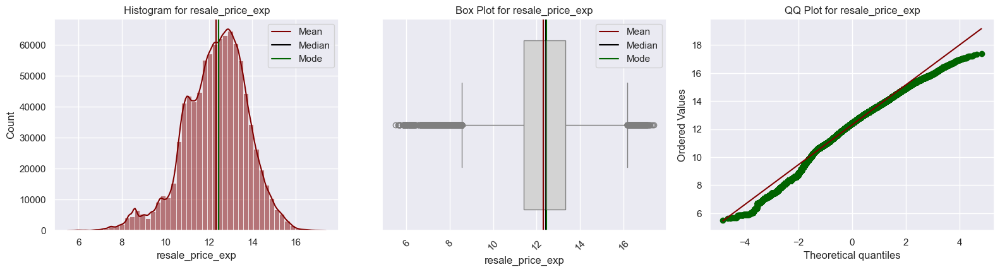



Skew for resale_price_exp is -0.47

Kurtosis for resale_price_exp is 0.48




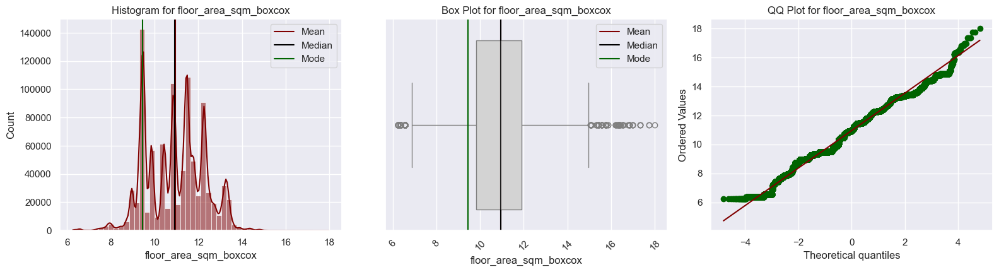



Skew for floor_area_sqm_boxcox is -0.02

Kurtosis for floor_area_sqm_boxcox is -0.55




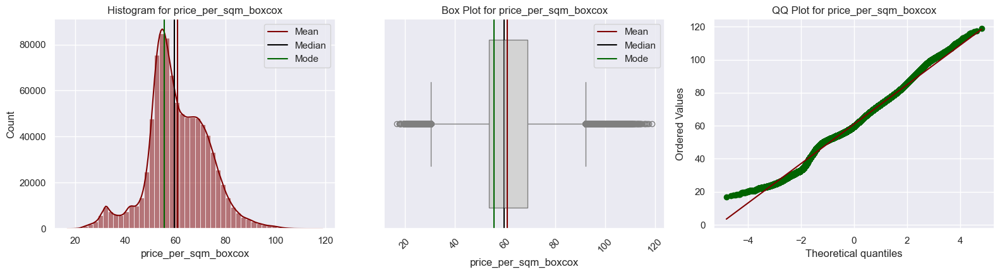



Skew for price_per_sqm_boxcox is 0.04

Kurtosis for price_per_sqm_boxcox is 0.57




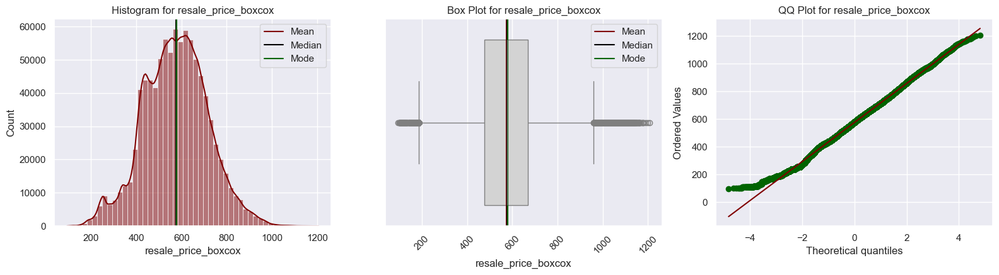



Skew for resale_price_boxcox is -0.00

Kurtosis for resale_price_boxcox is 0.05


Skewness:
 {'floor_area_sqm_log': -0.23334388, 'price_per_sqm_log': -0.8184514040088516, 'resale_price_log': -0.9241858845382089, 'floor_area_sqm_square': 0.07508402, 'price_per_sqm_square': 0.2184000056823869, 'resale_price_square': 0.10699699507707167, 'floor_area_sqm_rec': 1.1036736, 'price_per_sqm_rec': 4.092842125511875, 'resale_price_rec': 7.24265494560536, 'floor_area_sqm_sig': 0.0, 'price_per_sqm_sig': 0.0, 'resale_price_sig': 0.0, 'floor_area_sqm_pow': 1.0026332, 'price_per_sqm_pow': 2.985980062146995, 'resale_price_pow': 2.802184434403729, 'floor_area_sqm_exp': -0.10569635, 'price_per_sqm_exp': -0.3680042268192941, 'resale_price_exp': -0.46532610195770835, 'floor_area_sqm_boxcox': -0.017337631, 'price_per_sqm_boxcox': 0.0379470031974289, 'resale_price_boxcox': -0.0008747613479507505} 

 Kurtois:
 {'floor_area_sqm_log': -0.35770032, 'price_per_sqm_log': 1.868267357554115, 'resale_price_log': 1.

In [115]:
transformed_skewness = {}
transformed_kurtosis = {}
for i in normalized_df_cleaned.columns:
    univar_num(normalized_df_cleaned,i)
    skews=normalized_df_cleaned[i].skew()
    kurt=normalized_df_cleaned[i].kurtosis()
    transformed_skewness.update({i:skews})
    transformed_kurtosis.update({i:kurt})
    color = color_neutral
    if -0.5 <= skews <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skews <= 0.5 or -0.5 < skews < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
      
    print(f"\n\n{color}Skew for {i} is {skews:.2f}{color_neutral}")    
    print(f"\n{color}Kurtosis for {i} is {kurt:.2f}{color_neutral}\n\n")
print( 'Skewness:\n',transformed_skewness,'\n\n','Kurtois:\n',transformed_kurtosis)

In [ ]:
df1.sample(5)

In [ ]:
df1.sample(5)